In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


df = pd.read_csv("survey-data.csv")
df.head(5)

,ResponseId,MainBranch,Age,Employment,RemoteWork,Check,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,...,JobSatPoints_6,JobSatPoints_7,JobSatPoints_8,JobSatPoints_9,JobSatPoints_10,JobSatPoints_11,SurveyLength,SurveyEase,ConvertedCompYearly,JobSat
0,1,I am a developer by profession,Under 18 years old,"Employed, full-time",Remote,Apples,Hobby,Primary/elementary school,Books / Physical media,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,35-44 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
2,3,I am a developer by profession,45-54 years old,"Employed, full-time",Remote,Apples,Hobby;Contribute to open-source projects;Other...,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Colleague;On the job tr...,Technical documentation;Blogs;Books;Written Tu...,...,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Easy,NaN,NaN
3,4,I am learning to code,18-24 years old,"Student, full-time",NaN,Apples,NaN,Some college/university study without earning ...,"Other online resources (e.g., videos, blogs, f...",Stack Overflow;How-to videos;Interactive tutorial,...,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Easy,NaN,NaN
4,5,I am a developer by profession,18-24 years old,"Student, full-time",NaN,Apples,NaN,"Secondary school (e.g. American high school, G...","Other online resources (e.g., videos, blogs, f...",Technical documentation;Blogs;Written Tutorial...,...,NaN,NaN,NaN,NaN,NaN,NaN,Too short,Easy,NaN,NaN


In [ ]:
!wget -O survey-data.csv https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv


--2025-12-30 13:13:45--  https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/n01PQ9pSmiRX6520flujwQ/survey-data.csv
Resolving cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)... 198.23.119.245
Connecting to cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud (cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud)|198.23.119.245|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 159525875 (152M) [text/csv]
Saving to: ‘survey-data.csv’

survey-data.csv     100%[===================>] 152.13M  46.4MB/s    in 3.6s    

2025-12-30 13:13:49 (41.9 MB/s) - ‘survey-data.csv’ saved [159525875/159525875]



In [ ]:
import sqlite3

conn = sqlite3.connect("survey-data.sqlite")

df.to_sql("main", conn, if_exists="replace", index=False)

conn.close()



In [ ]:
QUERY = """
SELECT Age, COUNT(*) as count
FROM main
GROUP BY Age
ORDER BY Age
"""
pd.read_sql(QUERY, conn)


,Age,count
0,18-24 years old,14098
1,25-34 years old,23911
2,35-44 years old,14942
3,45-54 years old,6249
4,55-64 years old,2575
5,65 years or older,772
6,Prefer not to say,322
7,Under 18 years old,2568


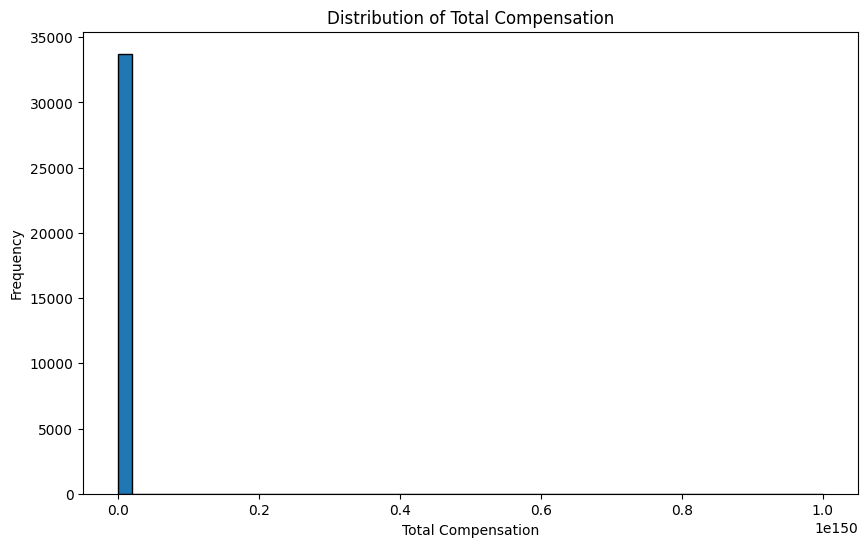

In [ ]:
plt.figure(figsize=(10, 6))
plt.hist(df['CompTotal'].dropna(), bins=50, edgecolor='black')
plt.xlabel('Total Compensation')
plt.ylabel('Frequency')
plt.title('Distribution of Total Compensation')
plt.show()

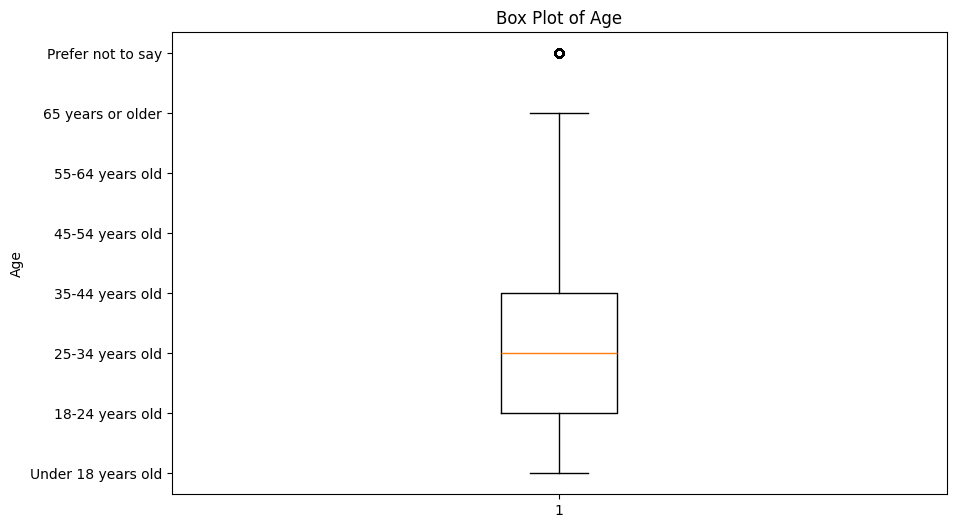

In [ ]:
age_order = [
    'Under 18 years old',
    '18-24 years old',
    '25-34 years old',
    '35-44 years old',
    '45-54 years old',
    '55-64 years old',
    '65 years or older',
    'Prefer not to say'
]

plt.figure(figsize=(10, 6))
age_counts = df['Age'].value_counts()
plt.boxplot([age_order.index(age) for age in df['Age'].dropna() if age in age_order])
plt.yticks(range(len(age_order)), age_order)
plt.ylabel('Age')
plt.title('Box Plot of Age')
plt.show()


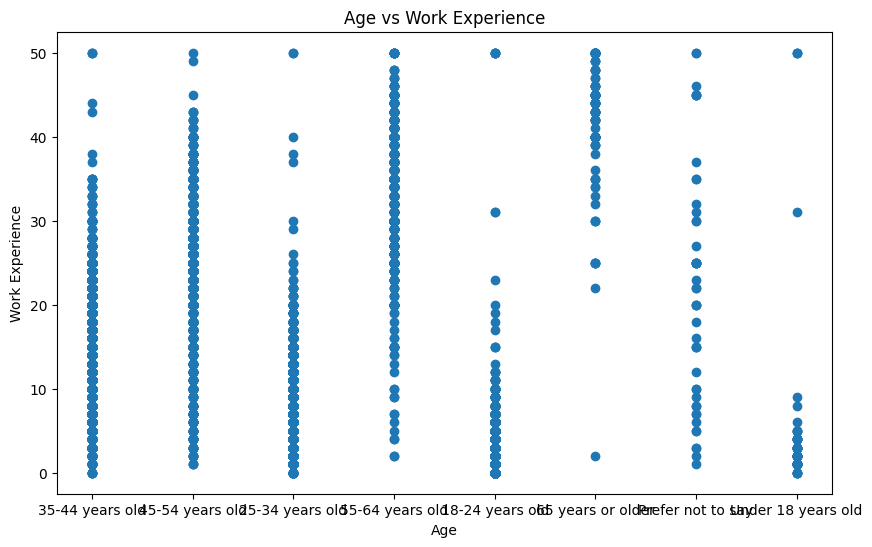

In [ ]:
plt.figure(figsize=(10, 6))
df_clean = df[['Age', 'WorkExp']].dropna()
plt.scatter(df_clean['Age'], df_clean['WorkExp'])
plt.xlabel('Age')
plt.ylabel('Work Experience')
plt.title('Age vs Work Experience')
plt.show()

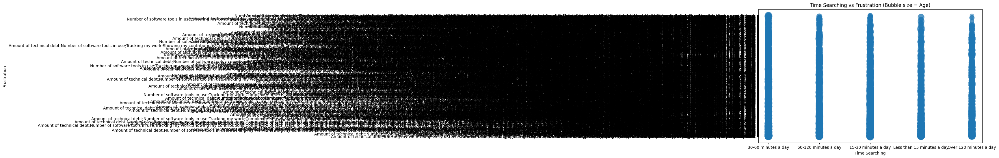

In [ ]:
age_mapping = {
    'Under 18 years old': 1,
    '18-24 years old': 2,
    '25-34 years old': 3,
    '35-44 years old': 4,
    '45-54 years old': 5,
    '55-64 years old': 6,
    '65 years or older': 7,
    'Prefer not to say': 3
}

plt.figure(figsize=(10, 6))
df_clean = df[['TimeSearching', 'Frustration', 'Age']].dropna()
bubble_sizes = df_clean['Age'].map(age_mapping) * 50
plt.scatter(df_clean['TimeSearching'], df_clean['Frustration'], s=bubble_sizes, alpha=0.5)
plt.xlabel('Time Searching')
plt.ylabel('Frustration')
plt.title('Time Searching vs Frustration (Bubble size = Age)')
plt.show()

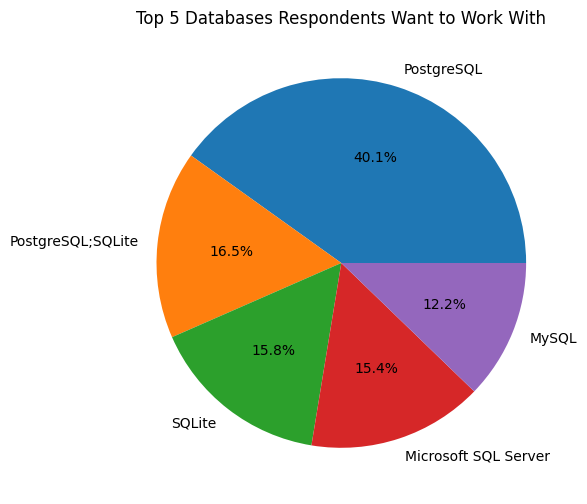

In [ ]:
plt.figure(figsize=(10, 6))
top5_databases = df['DatabaseWantToWorkWith'].value_counts().head(5)
plt.pie(top5_databases.values, labels=top5_databases.index, autopct='%1.1f%%')
plt.title('Top 5 Databases Respondents Want to Work With')
plt.show()

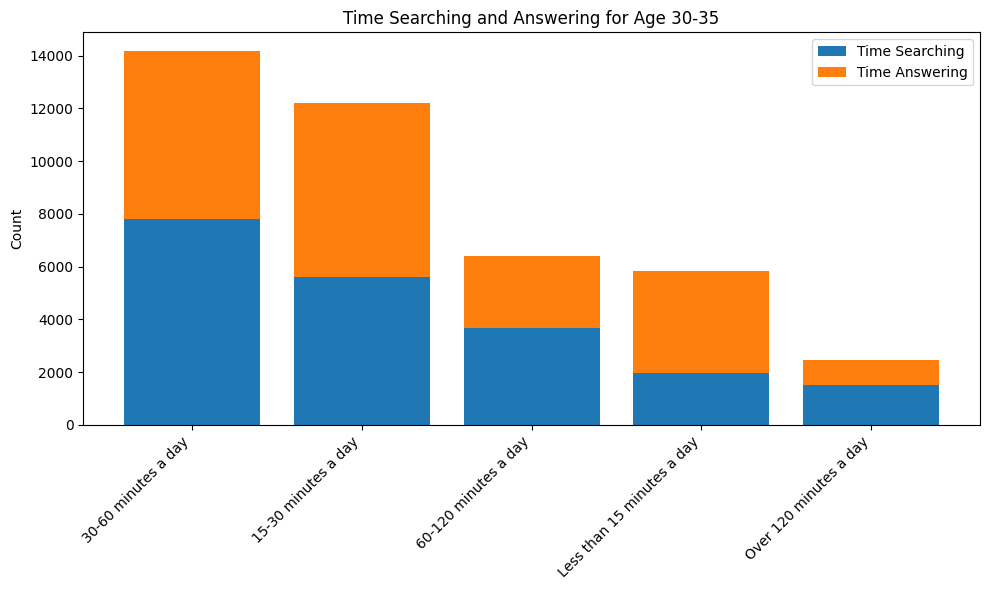

In [ ]:
df_filtered = df[df['Age'].isin(['25-34 years old', '35-44 years old'])].copy()

time_searching_counts = df_filtered['TimeSearching'].value_counts()
time_answering_counts = df_filtered['TimeAnswering'].value_counts()

categories = time_searching_counts.index.tolist()

plt.figure(figsize=(10, 6))
plt.bar(range(len(categories)), time_searching_counts.values, label='Time Searching')
plt.bar(range(len(categories)), time_answering_counts.reindex(categories, fill_value=0).values,
        bottom=time_searching_counts.values, label='Time Answering')
plt.xticks(range(len(categories)), categories, rotation=45, ha='right')
plt.ylabel('Count')
plt.title('Time Searching and Answering for Age 30-35')
plt.legend()
plt.tight_layout()
plt.show()

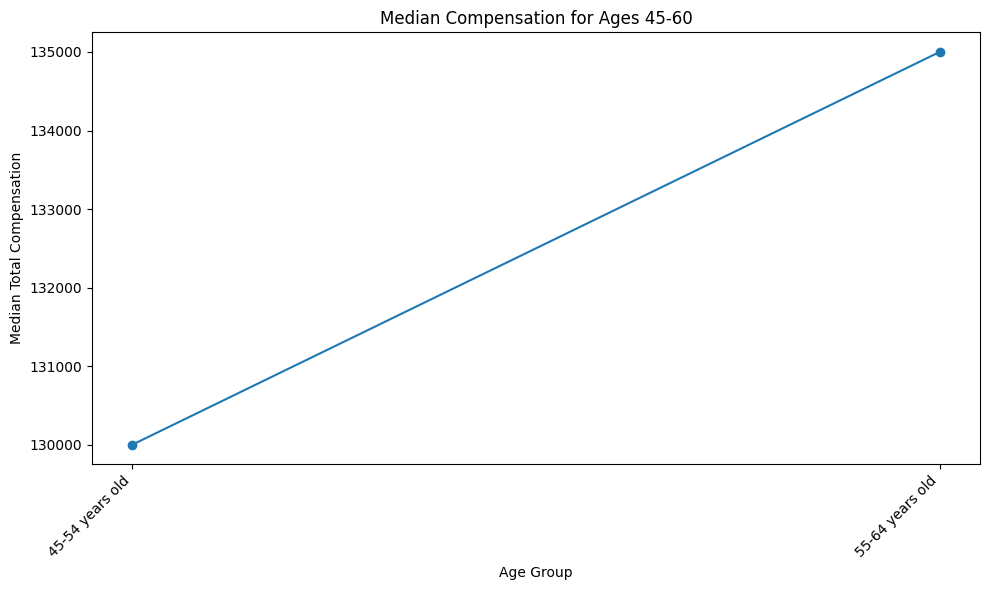

In [ ]:
age_filtered = df[df['Age'].isin(['45-54 years old', '55-64 years old'])].copy()

median_comp = age_filtered.groupby('Age')['CompTotal'].median()

age_order = ['45-54 years old', '55-64 years old']
median_comp = median_comp.reindex(age_order)

plt.figure(figsize=(10, 6))
plt.plot(median_comp.index, median_comp.values, marker='o')
plt.xlabel('Age Group')
plt.ylabel('Median Total Compensation')
plt.title('Median Compensation for Ages 45-60')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

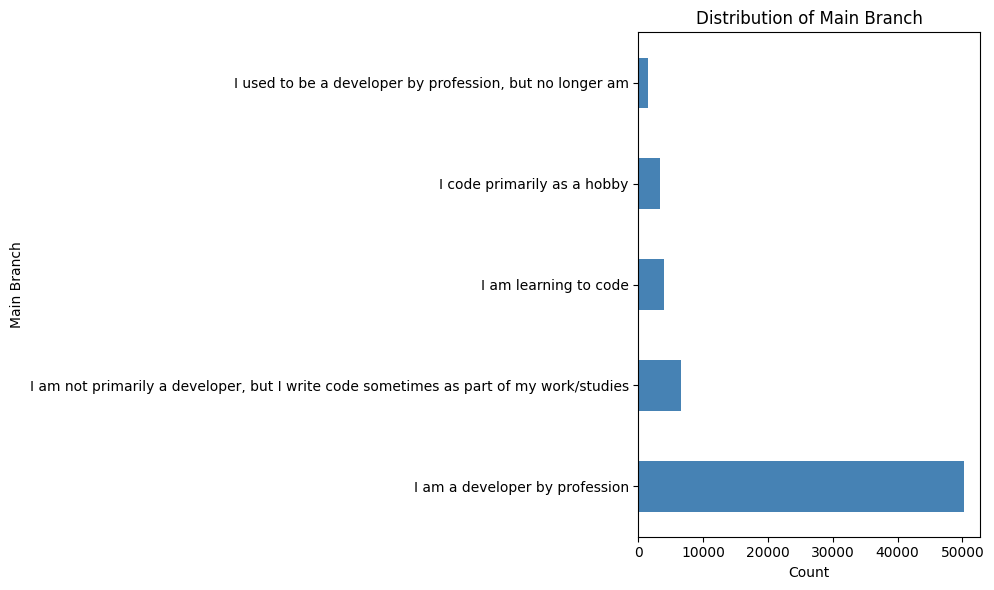

In [ ]:
df_clean = df['MainBranch'].dropna()
mainbranch_counts = df_clean.value_counts()

plt.figure(figsize=(10, 6))
mainbranch_counts.plot(kind='barh', color='steelblue')
plt.xlabel('Count')
plt.ylabel('Main Branch')
plt.title('Distribution of Main Branch')
plt.tight_layout()
plt.show()

**# Part 1 completed**


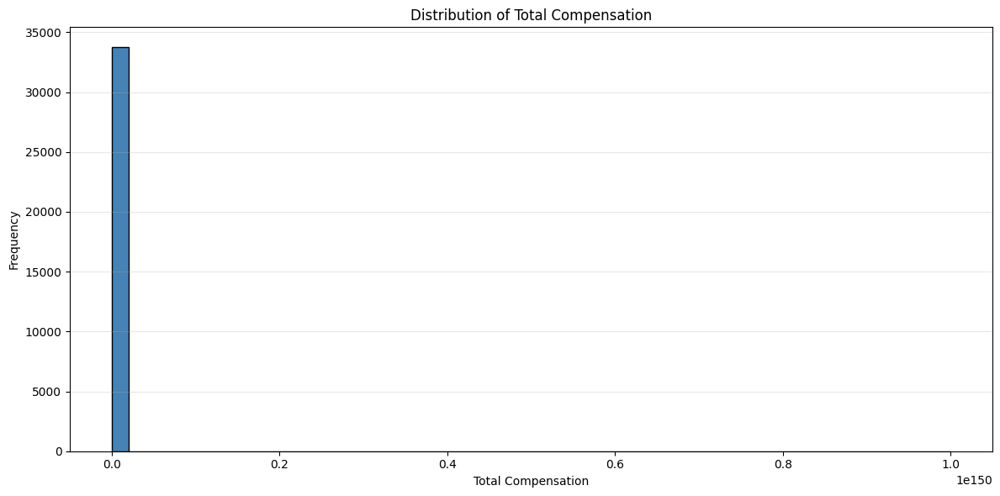

Mean: $29,638,411,381,149,976,434,844,996,221,255,135,810,973,346,761,641,119,443,102,059,683,642,337,023,745,002,072,541,016,011,726,778,410,233,362,892,066,394,456,411,829,798,103,125,811,458,473,984.00
Median: $110,000.00


In [ ]:
# Histogram of CompTotal (Total Compensation)
# Objective: Plot a histogram of CompTotal to visualize the distribution of respondents' total compensation.

df_comp = df['CompTotal'].dropna()
df_comp = pd.to_numeric(df_comp, errors='coerce').dropna()

plt.figure(figsize=(12, 6))
plt.hist(df_comp, bins=50, color='steelblue', edgecolor='black')
plt.xlabel('Total Compensation')
plt.ylabel('Frequency')
plt.title('Distribution of Total Compensation')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Mean: ${df_comp.mean():,.2f}")
print(f"Median: ${df_comp.median():,.2f}")

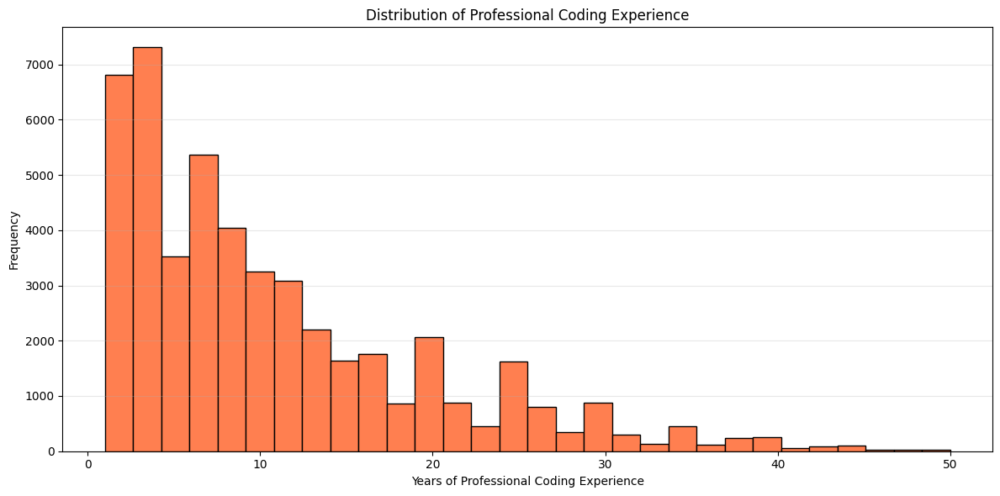

Mean: 10.74 years
Median: 8.00 years


In [ ]:
# 1.2 Histogram of YearsCodePro (Years of Professional Coding Experience)
# Objective: Plot a histogram of YearsCodePro to analyze the distribution of coding experience among respondents.

df_years = df['YearsCodePro'].dropna()
df_years = pd.to_numeric(df_years, errors='coerce').dropna()

plt.figure(figsize=(12, 6))
plt.hist(df_years, bins=30, color='coral', edgecolor='black')
plt.xlabel('Years of Professional Coding Experience')
plt.ylabel('Frequency')
plt.title('Distribution of Professional Coding Experience')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Mean: {df_years.mean():.2f} years")
print(f"Median: {df_years.median():.2f} years")

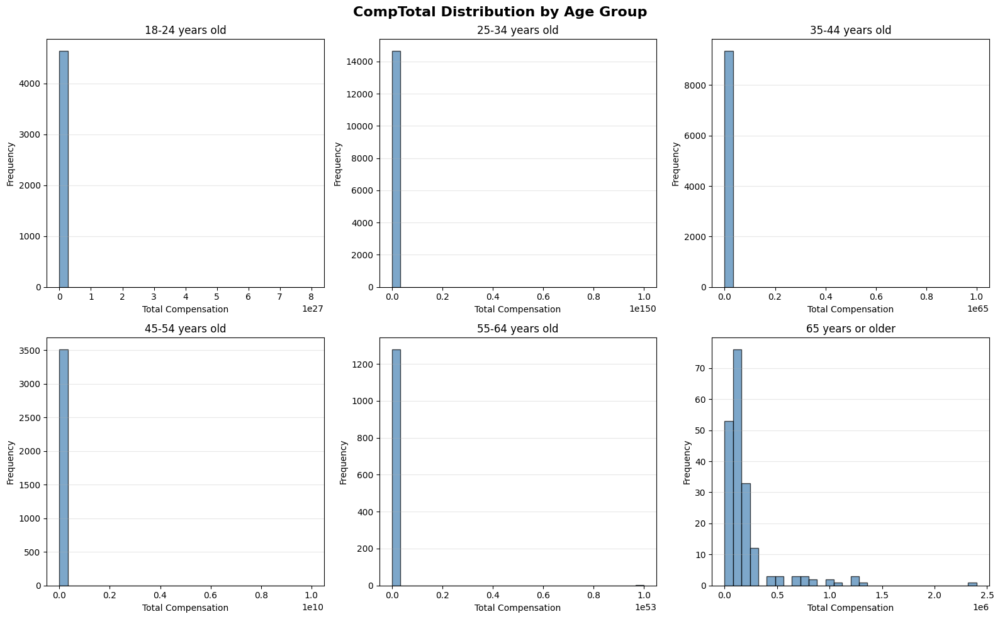

In [ ]:

# Histogram Comparison of CompTotal by Age Group
# Objective: Use histograms to compare the distribution of CompTotal across different Age groups.

df_clean = df[['CompTotal', 'Age']].dropna()
df_clean['CompTotal'] = pd.to_numeric(df_clean['CompTotal'], errors='coerce')
df_clean = df_clean.dropna()

age_groups = df_clean['Age'].unique()

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for idx, age_group in enumerate(age_groups[:6]):
    data = df_clean[df_clean['Age'] == age_group]['CompTotal']
    axes[idx].hist(data, bins=30, color='steelblue', edgecolor='black', alpha=0.7)
    axes[idx].set_title(f'{age_group}')
    axes[idx].set_xlabel('Total Compensation')
    axes[idx].set_ylabel('Frequency')
    axes[idx].grid(axis='y', alpha=0.3)

for idx in range(len(age_groups), len(axes)):
    fig.delaxes(axes[idx])

plt.suptitle('CompTotal Distribution by Age Group', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

In [ ]:
# 2.2 Histogram of TimeSearching for Different Age Groups
# Objective: Use histograms to explore the distribution of TimeSearching (time spent searching for information) for respondents across different age groups.

print(f"Total rows after cleaning: {len(df_clean)}")
print(f"Age groups found: {age_groups}")
print(f"TimeSearching sample: {df_clean['TimeSearching'].head()}")
df_clean = df[['TimeSearching', 'Age']].dropna()
df_clean['TimeSearching'] = pd.to_numeric(df_clean['TimeSearching'], errors='coerce')
df_clean = df_clean.dropna()

age_groups = df_clean['Age'].unique()

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for idx, age_group in enumerate(age_groups[:6]):
    data = df_clean[df_clean['Age'] == age_group]['TimeSearching']
    axes[idx].hist(data, bins=20, color='coral', edgecolor='black', alpha=0.7)
    axes[idx].set_title(f'{age_group}')
    axes[idx].set_xlabel('Time Searching')
    axes[idx].set_ylabel('Frequency')
    axes[idx].grid(axis='y', alpha=0.3)

for idx in range(len(age_groups), len(axes)):
    fig.delaxes(axes[idx])

plt.suptitle('TimeSearching Distribution by Age Group', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

Total rows after cleaning: 0
Age groups found: []
TimeSearching sample: Series([], Name: TimeSearching, dtype: float64)


<Figure size 1600x1000 with 0 Axes>

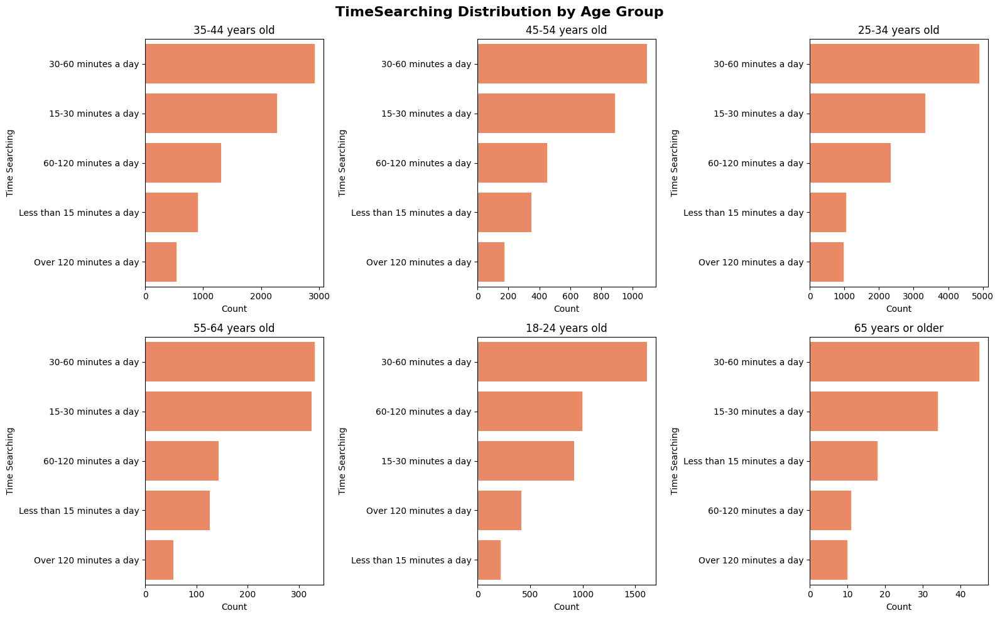

In [ ]:

# 2.2 Histogram of TimeSearching for Different Age Groups
# Objective: Use histograms to explore the distribution of TimeSearching (time spent searching for information) for respondents across different age groups.

import seaborn as sns
df_clean = df[['TimeSearching', 'Age']].dropna()

age_groups = df_clean['Age'].unique()

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.flatten()

for idx, age_group in enumerate(age_groups[:6]):
    data = df_clean[df_clean['Age'] == age_group]['TimeSearching']
    sns.countplot(y=data, ax=axes[idx], color='coral', order=data.value_counts().index)
    axes[idx].set_title(f'{age_group}')
    axes[idx].set_xlabel('Count')
    axes[idx].set_ylabel('Time Searching')

for idx in range(len(age_groups), len(axes)):
    fig.delaxes(axes[idx])

plt.suptitle('TimeSearching Distribution by Age Group', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


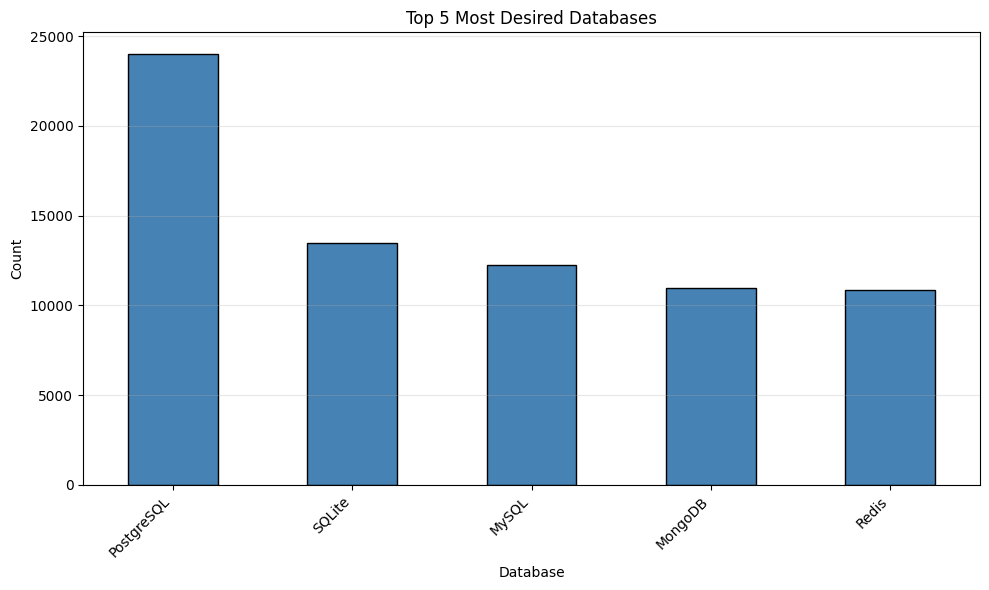

Top 5 Desired Databases:
DatabaseWantToWorkWith
PostgreSQL    24005
SQLite        13489
MySQL         12269
MongoDB       10982
Redis         10847
Name: count, dtype: int64


In [ ]:
# Histogram of Most Desired Databases (DatabaseWantToWorkWith)
# Objective: Visualize the most desired databases for future learning using a histogram of the top 5 databases.

import pandas as pd
import matplotlib.pyplot as plt

df_db = df['DatabaseWantToWorkWith'].dropna()
df_db = df_db.str.split(';').explode().str.strip()

top_databases = df_db.value_counts().head(5)

plt.figure(figsize=(10, 6))
top_databases.plot(kind='bar', color='steelblue', edgecolor='black')
plt.xlabel('Database')
plt.ylabel('Count')
plt.title('Top 5 Most Desired Databases')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("Top 5 Desired Databases:")
print(top_databases)

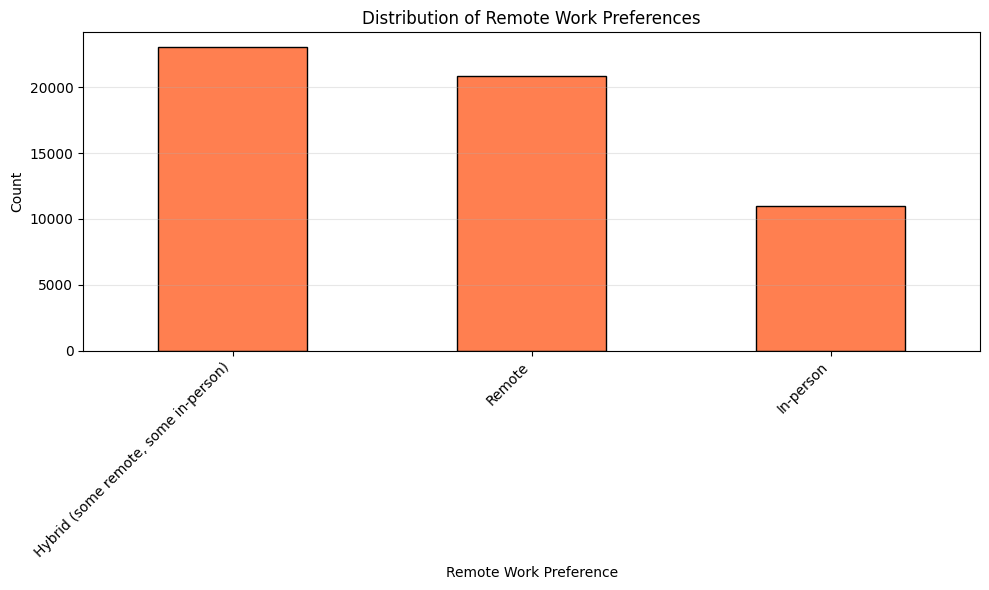

Remote Work Distribution:
RemoteWork
Hybrid (some remote, some in-person)    23015
Remote                                  20831
In-person                               10960
Name: count, dtype: int64


In [ ]:
# Histogram of Preferred Work Locations (RemoteWork)
# Objective: Use a histogram to explore the distribution of preferred work arrangements (remote work).

df_remote = df['RemoteWork'].dropna()
remote_counts = df_remote.value_counts()

plt.figure(figsize=(10, 6))
remote_counts.plot(kind='bar', color='coral', edgecolor='black')
plt.xlabel('Remote Work Preference')
plt.ylabel('Count')
plt.title('Distribution of Remote Work Preferences')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print("Remote Work Distribution:")
print(remote_counts)

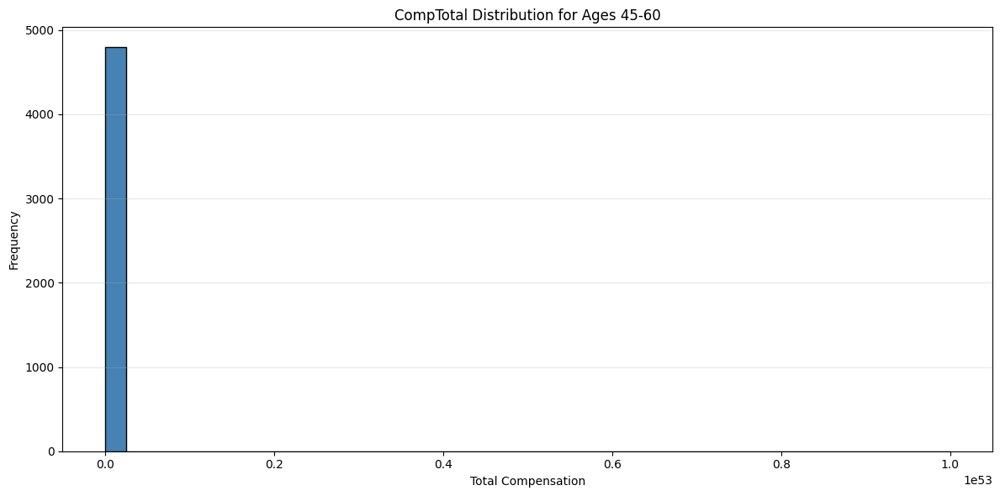

Count: 4795
Median: $131,000.00
Mean: $20,855,057,351,407,715,106,378,910,679,098,880,718,619,583,447,040.00


In [ ]:
# Histogram of Median CompTotal for Ages 45 to 60
# Objective: Plot the histogram for CompTotal within the age group 45 to 60 to analyze compensation distribution among mid-career respondents.
age_mapping = {
    '45-54 years old': 49.5,
    '55-64 years old': 59.5
}

df_clean = df[['Age', 'CompTotal']].dropna()
df_clean['Age_Numeric'] = df_clean['Age'].map(age_mapping)
df_clean['CompTotal'] = pd.to_numeric(df_clean['CompTotal'], errors='coerce')
df_filtered = df_clean[(df_clean['Age_Numeric'] >= 45) & (df_clean['Age_Numeric'] <= 60)].dropna()

plt.figure(figsize=(12, 6))
plt.hist(df_filtered['CompTotal'], bins=40, color='steelblue', edgecolor='black')
plt.xlabel('Total Compensation')
plt.ylabel('Frequency')
plt.title('CompTotal Distribution for Ages 45-60')
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

print(f"Count: {len(df_filtered)}")
print(f"Median: ${df_filtered['CompTotal'].median():,.2f}")
print(f"Mean: ${df_filtered['CompTotal'].mean():,.2f}")

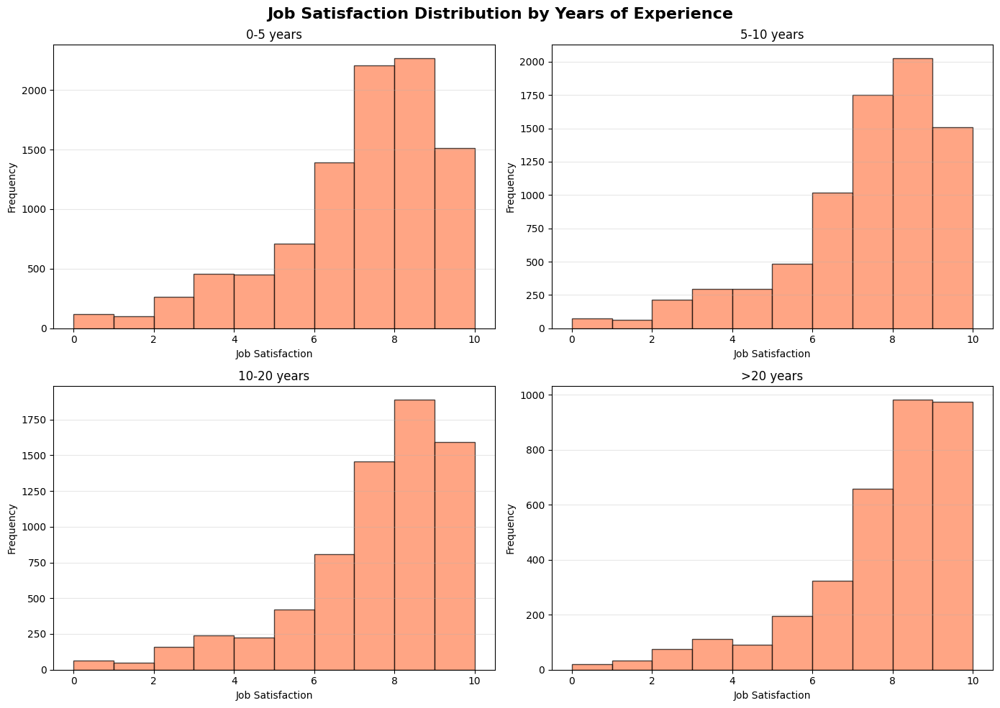

In [ ]:
# 4.2 Histogram of Job Satisfaction (JobSat) by YearsCodePro
# Objective: Plot the histogram for JobSat scores based on respondents' years of professional coding experience.

df_clean = df[['JobSat', 'YearsCodePro']].dropna()
df_clean['JobSat'] = pd.to_numeric(df_clean['JobSat'], errors='coerce')
df_clean['YearsCodePro'] = pd.to_numeric(df_clean['YearsCodePro'], errors='coerce')
df_clean = df_clean.dropna()

def categorize_experience(years):
    if years <= 5:
        return '0-5 years'
    elif years <= 10:
        return '5-10 years'
    elif years <= 20:
        return '10-20 years'
    else:
        return '>20 years'

df_clean['ExperienceRange'] = df_clean['YearsCodePro'].apply(categorize_experience)

exp_ranges = ['0-5 years', '5-10 years', '10-20 years', '>20 years']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for idx, exp_range in enumerate(exp_ranges):
    data = df_clean[df_clean['ExperienceRange'] == exp_range]['JobSat']
    axes[idx].hist(data, bins=10, color='coral', edgecolor='black', alpha=0.7)
    axes[idx].set_title(f'{exp_range}')
    axes[idx].set_xlabel('Job Satisfaction')
    axes[idx].set_ylabel('Frequency')
    axes[idx].grid(axis='y', alpha=0.3)

plt.suptitle('Job Satisfaction Distribution by Years of Experience', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# **Part 2 completed**

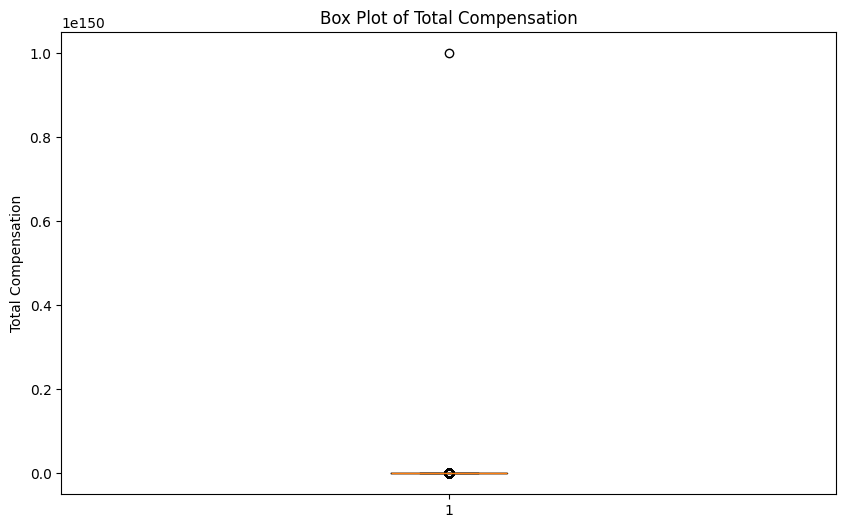

In [ ]:
# 1. Box Plot of CompTotal (Total Compensation)
# Use a box plot to analyze the distribution and outliers in total compensation.

plt.figure(figsize=(10, 6))
plt.boxplot(df['CompTotal'].dropna())
plt.ylabel('Total Compensation')
plt.title('Box Plot of Total Compensation')
plt.show()

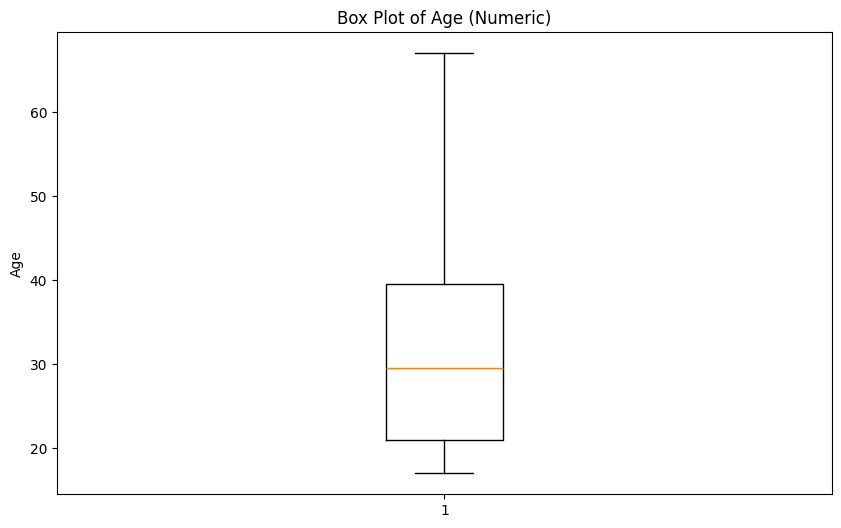

In [ ]:
# Box Plot of Age (converted to numeric values) Convert the Age column into numerical values and visualize the distribution.

age_mapping = {
    'Under 18 years old': 17,
    '18-24 years old': 21,
    '25-34 years old': 29.5,
    '35-44 years old': 39.5,
    '45-54 years old': 49.5,
    '55-64 years old': 59.5,
    '65 years or older': 67,
    'Prefer not to say': None
}

df['Age_numeric'] = df['Age'].map(age_mapping)

plt.figure(figsize=(10, 6))
plt.boxplot(df['Age_numeric'].dropna())
plt.ylabel('Age')
plt.title('Box Plot of Age (Numeric)')
plt.show()

/tmp/ipython-input-3440145167.py:18: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_by_age, labels=age_order)


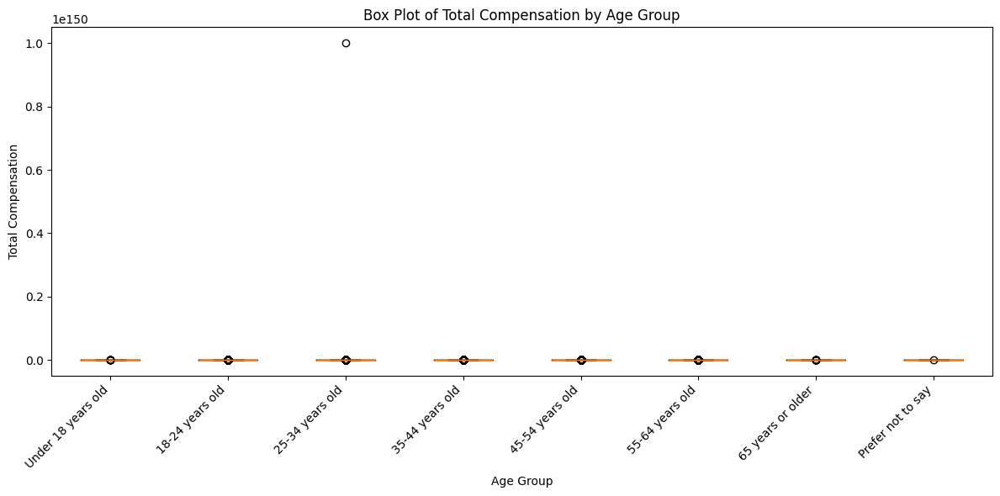

In [ ]:
# Box Plot of CompTotal Grouped by Age Groups:
# Visualize the distribution of compensation across different age groups.

age_order = [
    'Under 18 years old',
    '18-24 years old',
    '25-34 years old',
    '35-44 years old',
    '45-54 years old',
    '55-64 years old',
    '65 years or older',
    'Prefer not to say'
]

data_by_age = [df[df['Age'] == age]['CompTotal'].dropna().values for age in age_order]

plt.figure(figsize=(12, 6))
plt.boxplot(data_by_age, labels=age_order)
plt.xlabel('Age Group')
plt.ylabel('Total Compensation')
plt.title('Box Plot of Total Compensation by Age Group')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

/tmp/ipython-input-714144993.py:10: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_by_satisfaction, labels=satisfaction_levels)


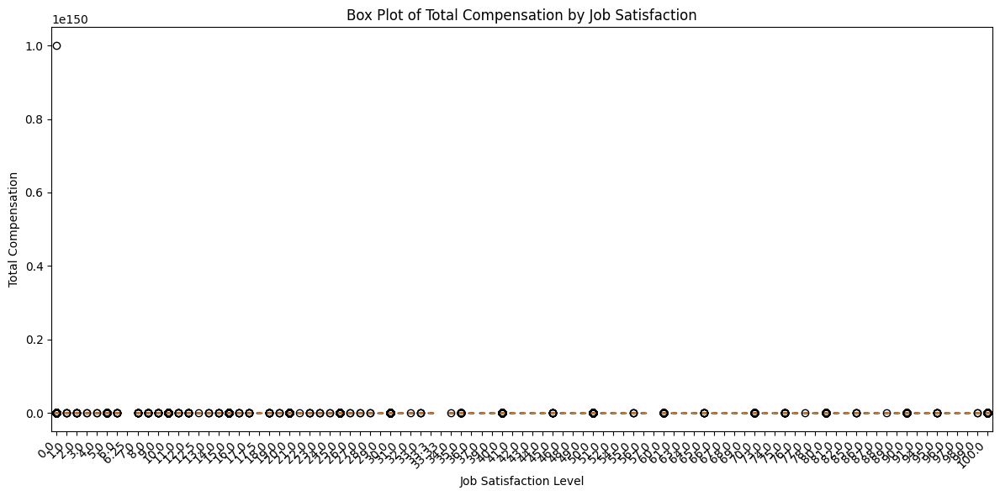

In [ ]:
# Box Plot of CompTotal Grouped by Job Satisfaction (JobSatPoints_6):
# Examine how compensation varies based on job satisfaction levels.

satisfaction_levels = df['JobSatPoints_6'].dropna().unique()
satisfaction_levels = sorted(satisfaction_levels)

data_by_satisfaction = [df[df['JobSatPoints_6'] == level]['CompTotal'].dropna().values for level in satisfaction_levels]

plt.figure(figsize=(12, 6))
plt.boxplot(data_by_satisfaction, labels=satisfaction_levels)
plt.xlabel('Job Satisfaction Level')
plt.ylabel('Total Compensation')
plt.title('Box Plot of Total Compensation by Job Satisfaction')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

/tmp/ipython-input-620576979.py:8: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_by_devtype, labels=top5_dev_types)


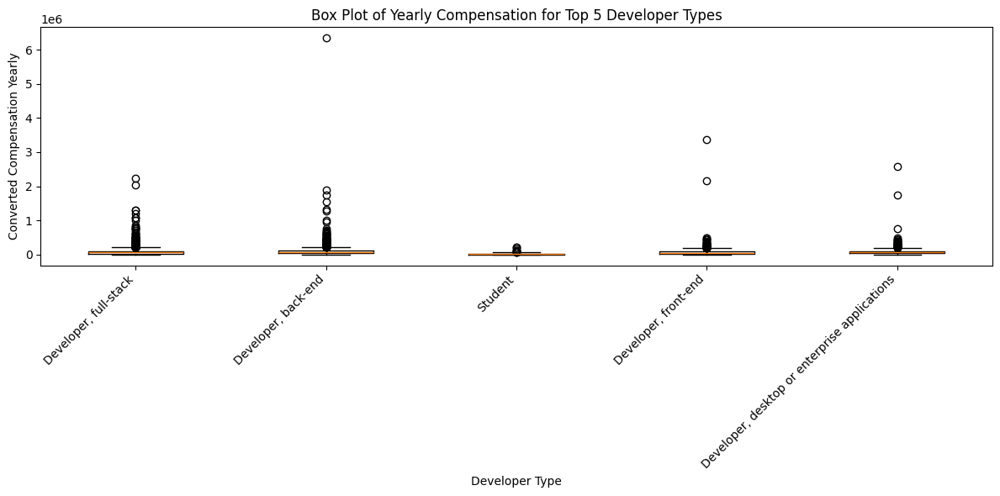

In [ ]:
# Box Plot of ConvertedCompYearly for the Top 5 Developer Types:
# Analyze compensation across the top 5 developer roles.
top5_dev_types = df['DevType'].value_counts().head(5).index

data_by_devtype = [df[df['DevType'] == dev]['ConvertedCompYearly'].dropna().values for dev in top5_dev_types]

plt.figure(figsize=(12, 6))
plt.boxplot(data_by_devtype, labels=top5_dev_types)
plt.xlabel('Developer Type')
plt.ylabel('Converted Compensation Yearly')
plt.title('Box Plot of Yearly Compensation for Top 5 Developer Types')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

/tmp/ipython-input-2542120361.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_by_country, labels=top5_countries)


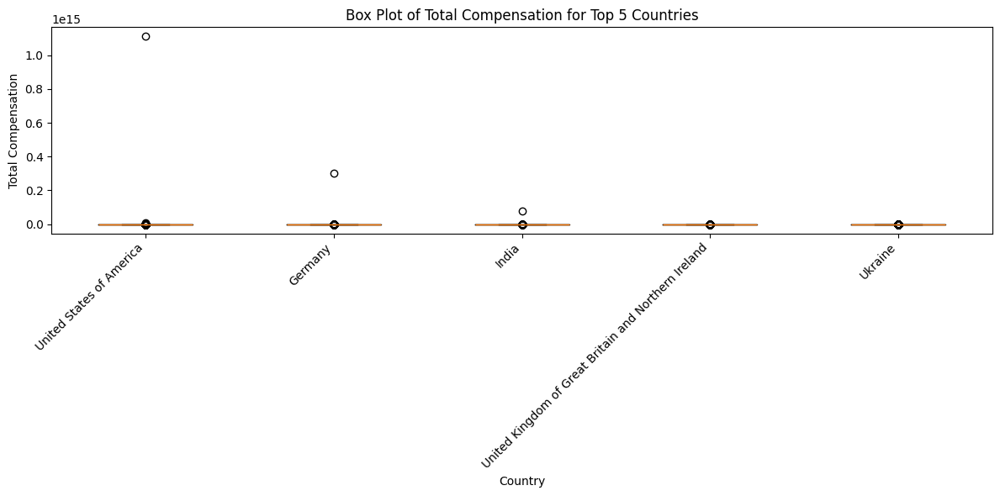

In [ ]:
# Box Plot of CompTotal for the Top 5 Countries:
# Analyze compensation across respondents from the top 5 countries.

top5_countries = df['Country'].value_counts().head(5).index

data_by_country = [df[df['Country'] == country]['CompTotal'].dropna().values for country in top5_countries]

plt.figure(figsize=(12, 6))
plt.boxplot(data_by_country, labels=top5_countries)
plt.xlabel('Country')
plt.ylabel('Total Compensation')
plt.title('Box Plot of Total Compensation for Top 5 Countries')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


/tmp/ipython-input-1269837837.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_by_employment, labels=employment_types)
/tmp/ipython-input-1269837837.py:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


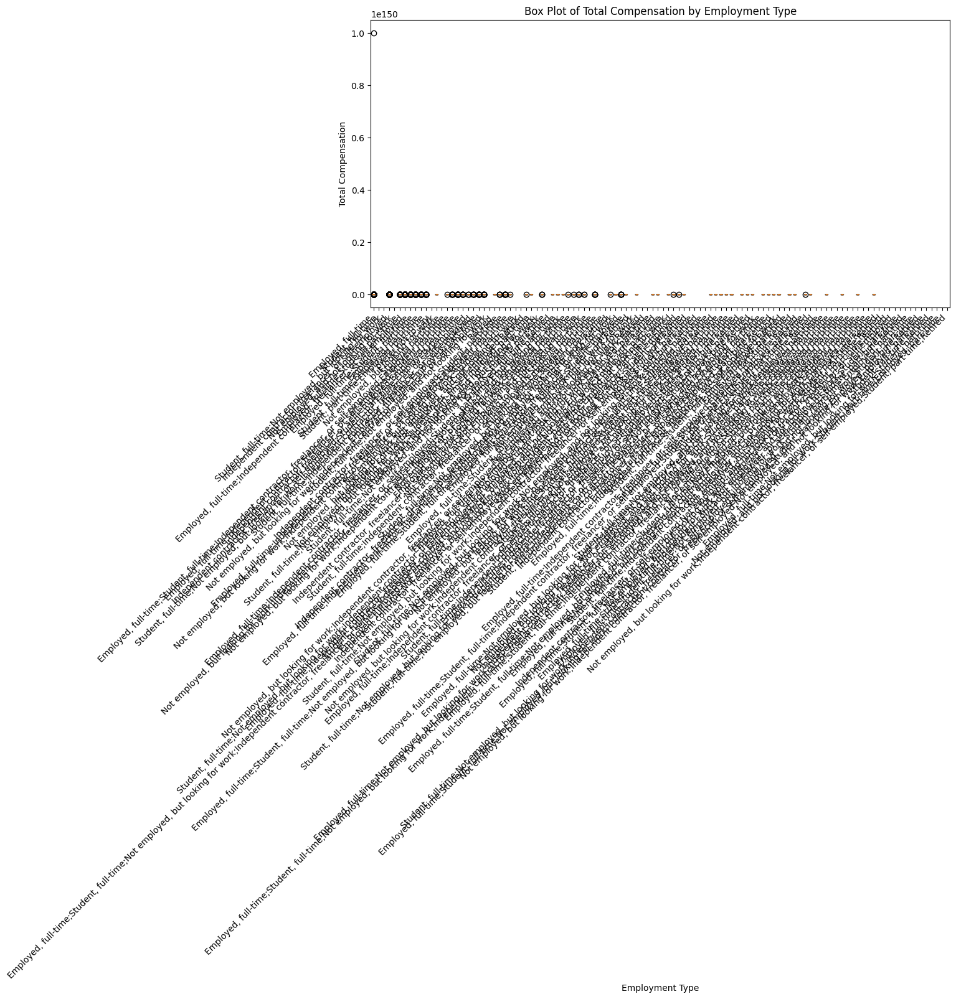

In [ ]:
# Box Plot of CompTotal Across Employment Types:
# Analyze compensation for different employment types.

employment_types = df['Employment'].dropna().unique()

data_by_employment = [df[df['Employment'] == emp]['CompTotal'].dropna().values for emp in employment_types]

plt.figure(figsize=(12, 6))
plt.boxplot(data_by_employment, labels=employment_types)
plt.xlabel('Employment Type')
plt.ylabel('Total Compensation')
plt.title('Box Plot of Total Compensation by Employment Type')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

/tmp/ipython-input-2605030513.py:10: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_by_satisfaction, labels=satisfaction_levels)


TypeError: ufunc 'divide' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

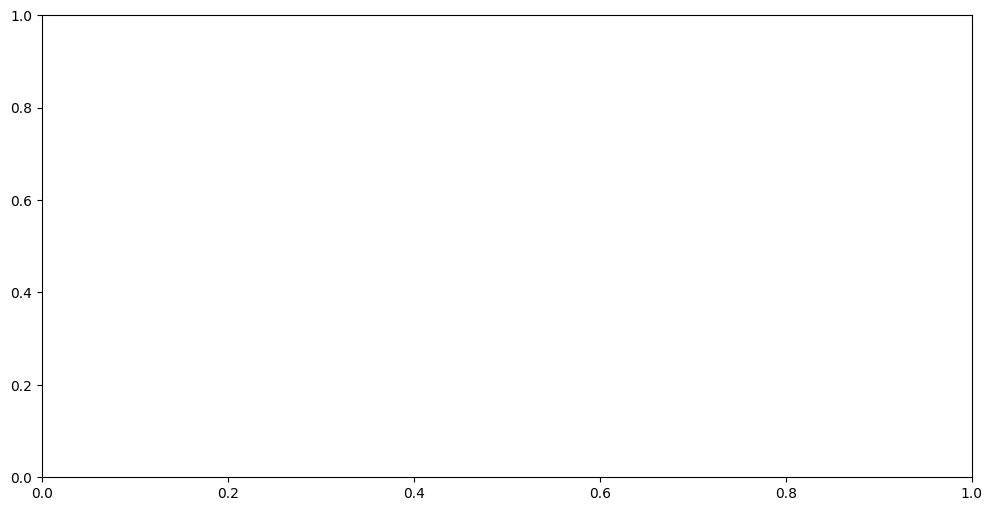

In [ ]:
# Box Plot of YearsCodePro by Job Satisfaction (JobSatPoints_6):
# Examine the distribution of professional coding years by job satisfaction levels.

satisfaction_levels = df['JobSatPoints_6'].dropna().unique()
satisfaction_levels = sorted(satisfaction_levels)

data_by_satisfaction = [df[df['JobSatPoints_6'] == level]['YearsCodePro'].dropna().values for level in satisfaction_levels]

plt.figure(figsize=(12, 6))
plt.boxplot(data_by_satisfaction, labels=satisfaction_levels)
plt.xlabel('Job Satisfaction Level')
plt.ylabel('Years of Professional Coding')
plt.title('Box Plot of Professional Coding Years by Job Satisfaction')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# **Part 3 completed**


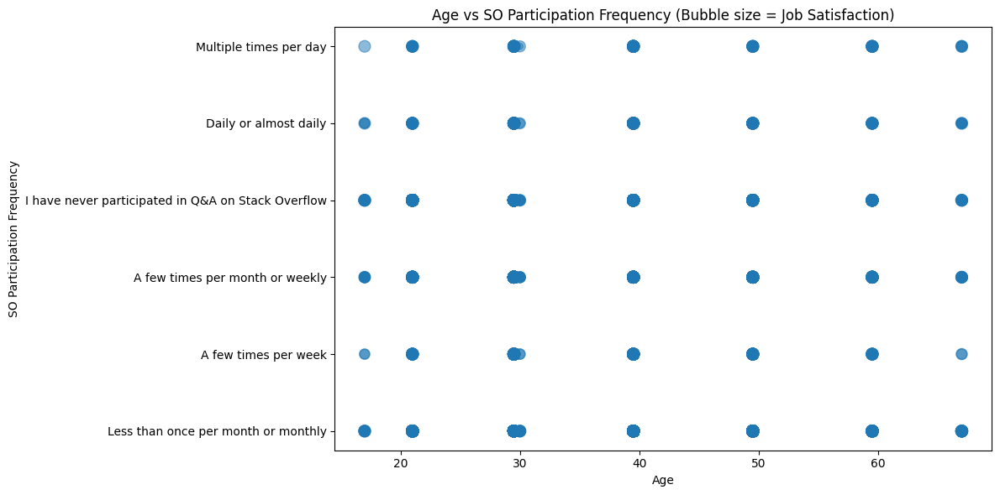

In [ ]:
# Bubble Plot for Age vs. Frequency of Participation¶
# * Visualize the relationship between respondents’ age and their participation frequency (SOPartFreq) using a bubble plot.
# * Use the size of the bubbles to represent their job satisfaction (JobSat).

df_clean = df[['Age', 'SOPartFreq', 'JobSat']].dropna()

age_mapping = {
    'Under 18 years old': 17,
    '18-24 years old': 21,
    '25-34 years old': 29.5,
    '35-44 years old': 39.5,
    '45-54 years old': 49.5,
    '55-64 years old': 59.5,
    '65 years or older': 67,
    'Prefer not to say': 30
}

df_clean['Age_numeric'] = df_clean['Age'].map(age_mapping)

# Map JobSat to numeric if it's categorical
jobsat_sizes = pd.to_numeric(df_clean['JobSat'], errors='coerce').fillna(1) * 10

plt.figure(figsize=(12, 6))
plt.scatter(df_clean['Age_numeric'], df_clean['SOPartFreq'], s=jobsat_sizes, alpha=0.5)
plt.xlabel('Age')
plt.ylabel('SO Participation Frequency')
plt.title('Age vs SO Participation Frequency (Bubble size = Job Satisfaction)')
plt.tight_layout()
plt.show()

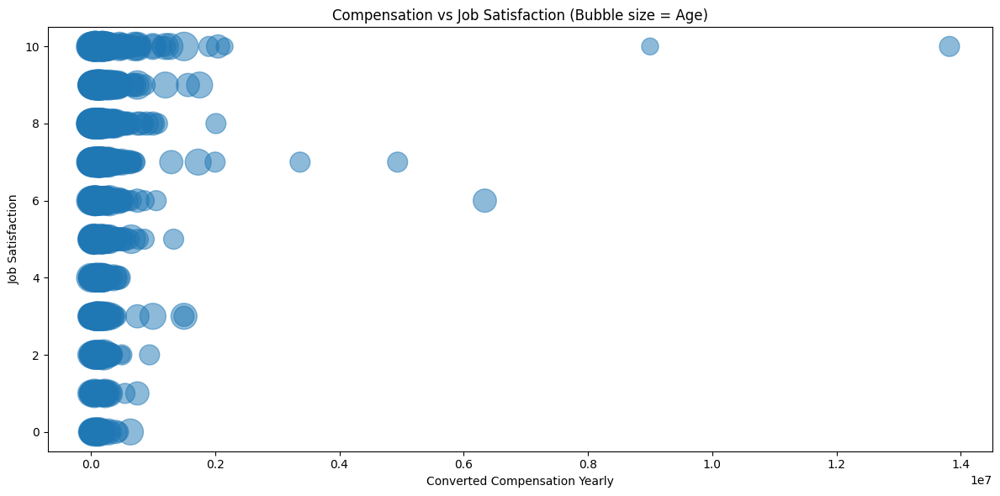

In [ ]:
# 2. Bubble Plot for Compensation vs. Job Satisfaction
# -Visualize the relationship between yearly compensation (ConvertedCompYearly) and job satisfaction (JobSat).
# Use the size of the bubbles to represent respondents’ age.

df_clean = df[['ConvertedCompYearly', 'JobSat', 'Age']].dropna()

age_mapping = {
    'Under 18 years old': 17,
    '18-24 years old': 21,
    '25-34 years old': 29.5,
    '35-44 years old': 39.5,
    '45-54 years old': 49.5,
    '55-64 years old': 59.5,
    '65 years or older': 67,
    'Prefer not to say': 30
}

df_clean['Age_numeric'] = df_clean['Age'].map(age_mapping)

plt.figure(figsize=(12, 6))
plt.scatter(df_clean['ConvertedCompYearly'], df_clean['JobSat'], s=df_clean['Age_numeric']*10, alpha=0.5)
plt.xlabel('Converted Compensation Yearly')
plt.ylabel('Job Satisfaction')
plt.title('Compensation vs Job Satisfaction (Bubble size = Age)')
plt.tight_layout()
plt.show()


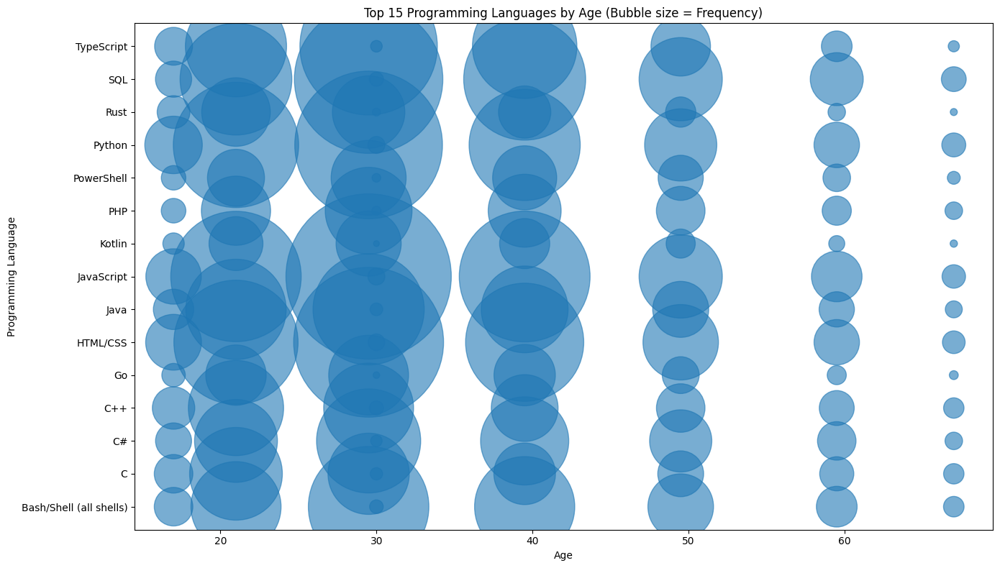

In [ ]:
# 1. Bubble Plot of Technology Preferences by Age¶
# Visualize the popularity of programming languages respondents have worked with (LanguageHaveWorkedWith) across age groups.
# Use bubble size to represent the frequency of each language.

df_clean = df[['Age', 'LanguageHaveWorkedWith']].dropna()

age_mapping = {
    'Under 18 years old': 17,
    '18-24 years old': 21,
    '25-34 years old': 29.5,
    '35-44 years old': 39.5,
    '45-54 years old': 49.5,
    '55-64 years old': 59.5,
    '65 years or older': 67,
    'Prefer not to say': 30
}

df_clean['Age_numeric'] = df_clean['Age'].map(age_mapping)

# Split languages
language_age_pairs = []
for _, row in df_clean.iterrows():
    languages = str(row['LanguageHaveWorkedWith']).split(';')
    for lang in languages:
        language_age_pairs.append({'Language': lang.strip(), 'Age': row['Age_numeric']})

df_lang_age = pd.DataFrame(language_age_pairs)

# Get top 15 languages
top15_languages = df_lang_age['Language'].value_counts().head(15).index
df_lang_age = df_lang_age[df_lang_age['Language'].isin(top15_languages)]

lang_age_counts = df_lang_age.groupby(['Language', 'Age']).size().reset_index(name='Count')

plt.figure(figsize=(14, 8))
plt.scatter(lang_age_counts['Age'], lang_age_counts['Language'], s=lang_age_counts['Count']*2, alpha=0.6)
plt.xlabel('Age')
plt.ylabel('Programming Language')
plt.title('Top 15 Programming Languages by Age (Bubble size = Frequency)')
plt.tight_layout()
plt.show()


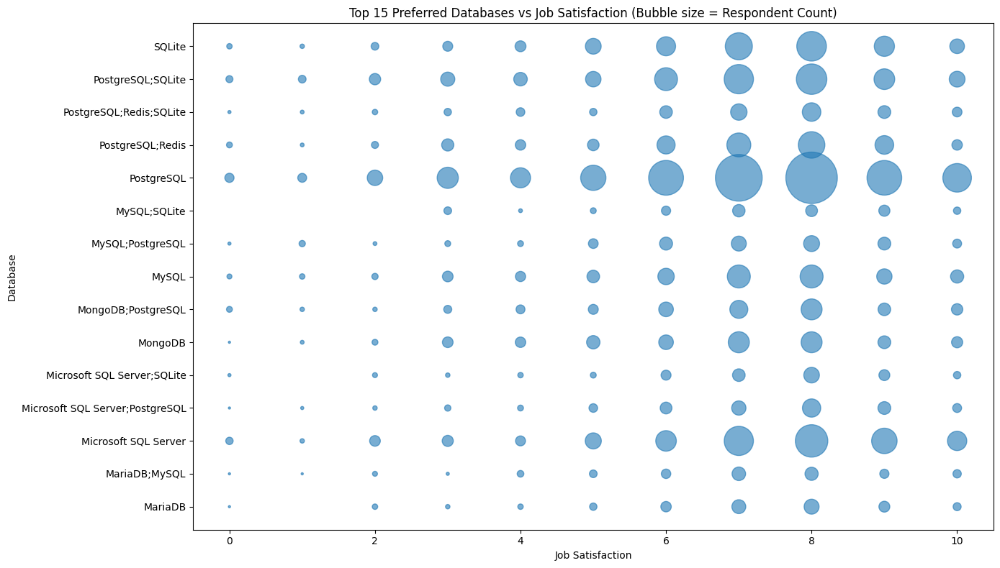

In [ ]:
# Bubble Plot for Preferred Databases vs. Job Satisfaction¶
# * Explore the relationship between preferred databases (DatabaseWantToWorkWith) and job satisfaction.
# * Use bubble size to indicate the number of respondents for each database.

df_clean = df[['DatabaseWantToWorkWith', 'JobSat']].dropna()

# Count occurrences of each database-jobsat combination
db_jobsat_counts = df_clean.groupby(['DatabaseWantToWorkWith', 'JobSat']).size().reset_index(name='Count')

# Get top 15 databases
top15_databases = df_clean['DatabaseWantToWorkWith'].value_counts().head(15).index
db_jobsat_counts = db_jobsat_counts[db_jobsat_counts['DatabaseWantToWorkWith'].isin(top15_databases)]

plt.figure(figsize=(14, 8))
plt.scatter(db_jobsat_counts['JobSat'], db_jobsat_counts['DatabaseWantToWorkWith'],
            s=db_jobsat_counts['Count']*5, alpha=0.6)
plt.xlabel('Job Satisfaction')
plt.ylabel('Database')
plt.title('Top 15 Preferred Databases vs Job Satisfaction (Bubble size = Respondent Count)')
plt.tight_layout()
plt.show()

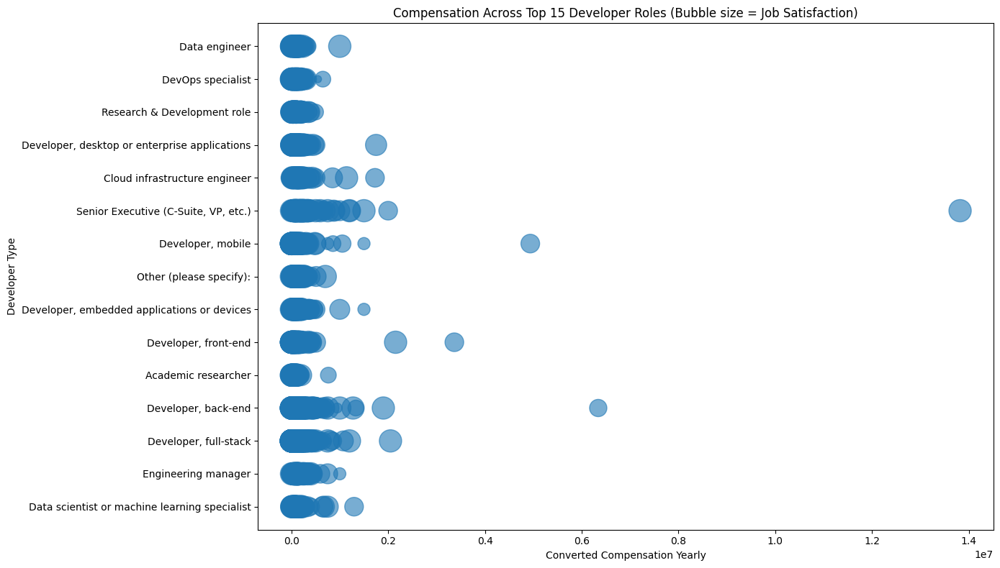

In [ ]:
# Bubble Plot for Compensation Across Developer Roles
# Visualize compensation (ConvertedCompYearly) across different developer roles (DevType).
# Use bubble size to represent job satisfaction.

df_clean = df[['DevType', 'ConvertedCompYearly', 'JobSat']].dropna()

# Get top 15 developer types
top15_devtypes = df_clean['DevType'].value_counts().head(15).index
df_clean = df_clean[df_clean['DevType'].isin(top15_devtypes)]

# Convert JobSat to numeric for bubble size
jobsat_numeric = pd.to_numeric(df_clean['JobSat'], errors='coerce').fillna(1)

plt.figure(figsize=(14, 8))
plt.scatter(df_clean['ConvertedCompYearly'], df_clean['DevType'],
            s=jobsat_numeric*50, alpha=0.6)
plt.xlabel('Converted Compensation Yearly')
plt.ylabel('Developer Type')
plt.title('Compensation Across Top 15 Developer Roles (Bubble size = Job Satisfaction)')
plt.tight_layout()
plt.show()

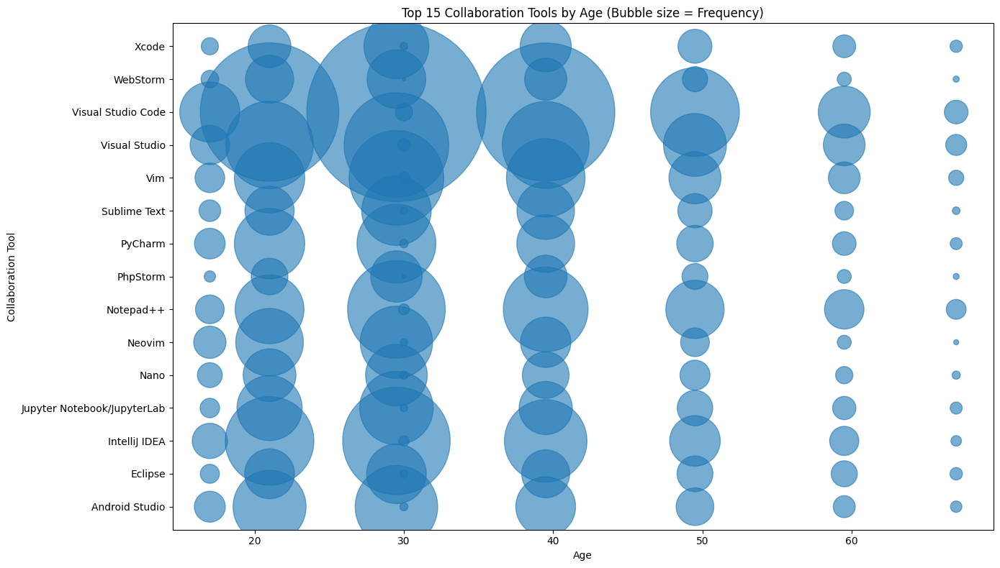

In [ ]:
# Bubble Plot for Collaboration Tools by Age¶
# * Visualize the relationship between the collaboration tools used (NEWCollabToolsHaveWorkedWith) and age groups.
# * Use bubble size to represent the frequency of tool usage.

df_clean = df[['Age', 'NEWCollabToolsHaveWorkedWith']].dropna()

age_mapping = {
    'Under 18 years old': 17,
    '18-24 years old': 21,
    '25-34 years old': 29.5,
    '35-44 years old': 39.5,
    '45-54 years old': 49.5,
    '55-64 years old': 59.5,
    '65 years or older': 67,
    'Prefer not to say': 30
}

df_clean['Age_numeric'] = df_clean['Age'].map(age_mapping)

# Split collaboration tools
tool_age_pairs = []
for _, row in df_clean.iterrows():
    tools = str(row['NEWCollabToolsHaveWorkedWith']).split(';')
    for tool in tools:
        tool_age_pairs.append({'Tool': tool.strip(), 'Age': row['Age_numeric']})

df_tool_age = pd.DataFrame(tool_age_pairs)

# Get top 15 collaboration tools
top15_tools = df_tool_age['Tool'].value_counts().head(15).index
df_tool_age = df_tool_age[df_tool_age['Tool'].isin(top15_tools)]

tool_age_counts = df_tool_age.groupby(['Tool', 'Age']).size().reset_index(name='Count')

plt.figure(figsize=(14, 8))
plt.scatter(tool_age_counts['Age'], tool_age_counts['Tool'],
            s=tool_age_counts['Count']*2, alpha=0.6)
plt.xlabel('Age')
plt.ylabel('Collaboration Tool')
plt.title('Top 15 Collaboration Tools by Age (Bubble size = Frequency)')
plt.tight_layout()
plt.show()

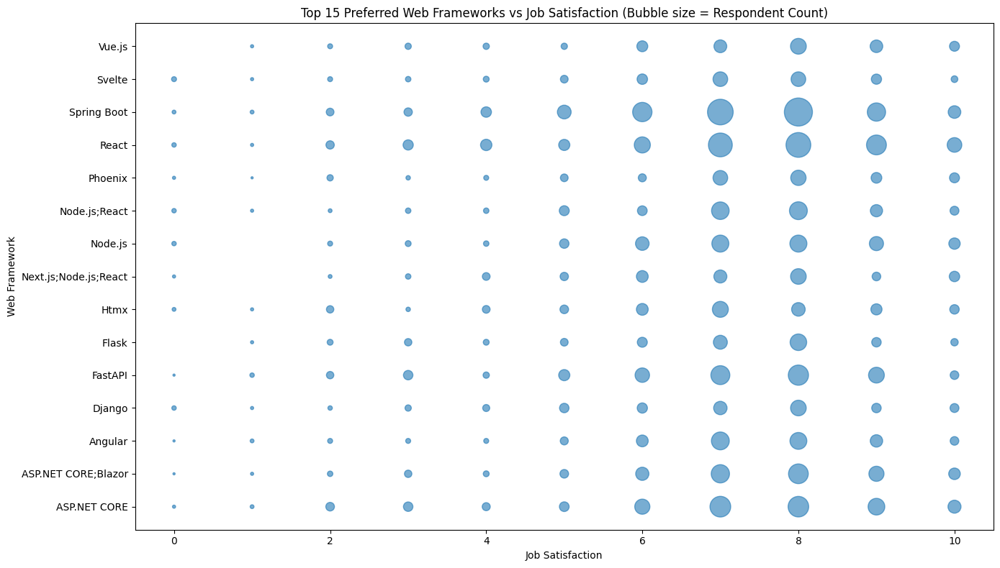

In [ ]:
# . Bubble Plot for Preferred Web Frameworks vs. Job Satisfaction¶
# * Explore the relationship between preferred web frameworks (WebframeWantToWorkWith) and job satisfaction.
# * Use bubble size to represent the number of respondents.
df_clean = df[['WebframeWantToWorkWith', 'JobSat']].dropna()

# Count occurrences of each framework-jobsat combination
framework_jobsat_counts = df_clean.groupby(['WebframeWantToWorkWith', 'JobSat']).size().reset_index(name='Count')

# Get top 15 web frameworks
top15_frameworks = df_clean['WebframeWantToWorkWith'].value_counts().head(15).index
framework_jobsat_counts = framework_jobsat_counts[framework_jobsat_counts['WebframeWantToWorkWith'].isin(top15_frameworks)]

plt.figure(figsize=(14, 8))
plt.scatter(framework_jobsat_counts['JobSat'], framework_jobsat_counts['WebframeWantToWorkWith'],
            s=framework_jobsat_counts['Count']*5, alpha=0.6)
plt.xlabel('Job Satisfaction')
plt.ylabel('Web Framework')
plt.title('Top 15 Preferred Web Frameworks vs Job Satisfaction (Bubble size = Respondent Count)')
plt.tight_layout()
plt.show()

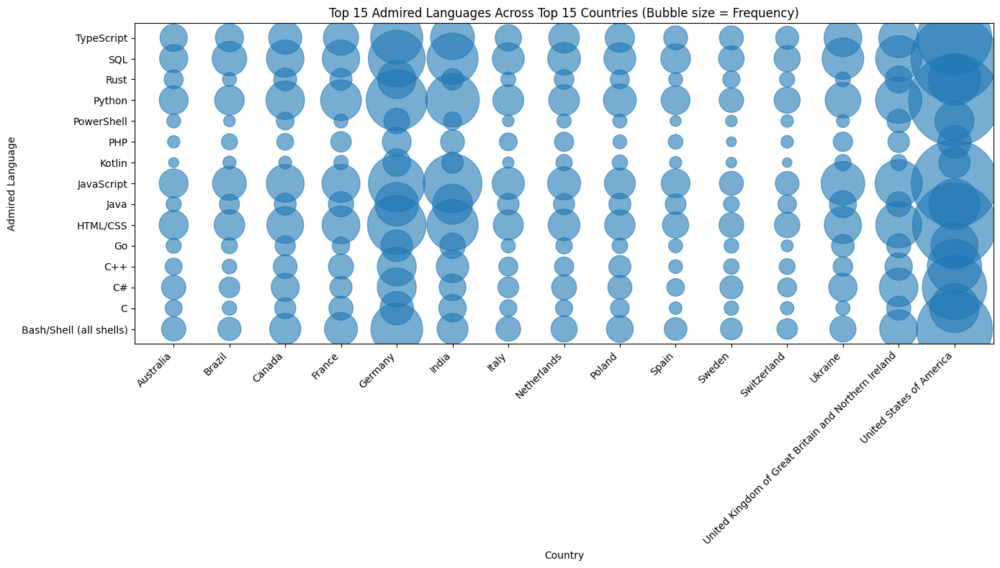

In [ ]:
# Bubble Plot for Admired Technologies Across Countries¶
# Visualize the distribution of admired technologies (LanguageAdmired) across different countries (Country).
# Use bubble size to represent the frequency of admiration.

df_clean = df[['Country', 'LanguageAdmired']].dropna()

# Split languages
lang_country_pairs = []
for _, row in df_clean.iterrows():
    languages = str(row['LanguageAdmired']).split(';')
    for lang in languages:
        lang_country_pairs.append({'Language': lang.strip(), 'Country': row['Country']})

df_lang_country = pd.DataFrame(lang_country_pairs)

# Get top 15 languages and top 15 countries
top15_languages = df_lang_country['Language'].value_counts().head(15).index
top15_countries = df_lang_country['Country'].value_counts().head(15).index

df_lang_country = df_lang_country[
    (df_lang_country['Language'].isin(top15_languages)) &
    (df_lang_country['Country'].isin(top15_countries))
]

lang_country_counts = df_lang_country.groupby(['Country', 'Language']).size().reset_index(name='Count')

plt.figure(figsize=(14, 8))
plt.scatter(lang_country_counts['Country'], lang_country_counts['Language'],
            s=lang_country_counts['Count']*2, alpha=0.6)
plt.xlabel('Country')
plt.ylabel('Admired Language')
plt.title('Top 15 Admired Languages Across Top 15 Countries (Bubble size = Frequency)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# **part 4 completed**


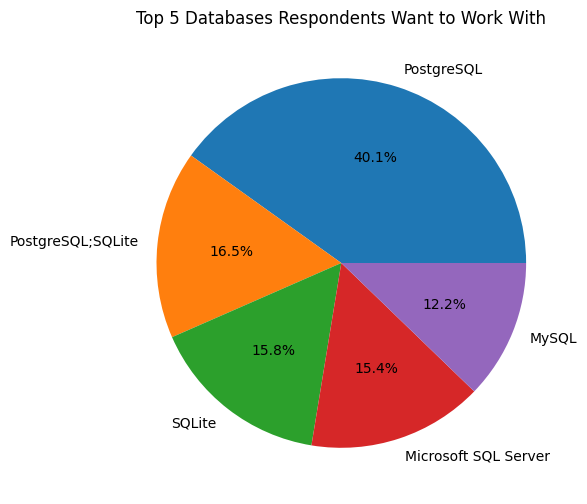

In [ ]:
# 1.1 Create a Pie Chart of the Top 5 Databases Respondents Want to Work With
# In the survey data, the DatabaseWantToWorkWith column lists the databases that respondents wish to work with. Let’s visualize the top 5 most-desired databases in a pie chart.

top5_databases = df['DatabaseWantToWorkWith'].value_counts().head(5)
plt.figure(figsize=(10, 6))
plt.pie(top5_databases.values, labels=top5_databases.index, autopct='%1.1f%%')
plt.title('Top 5 Databases Respondents Want to Work With')
plt.show()



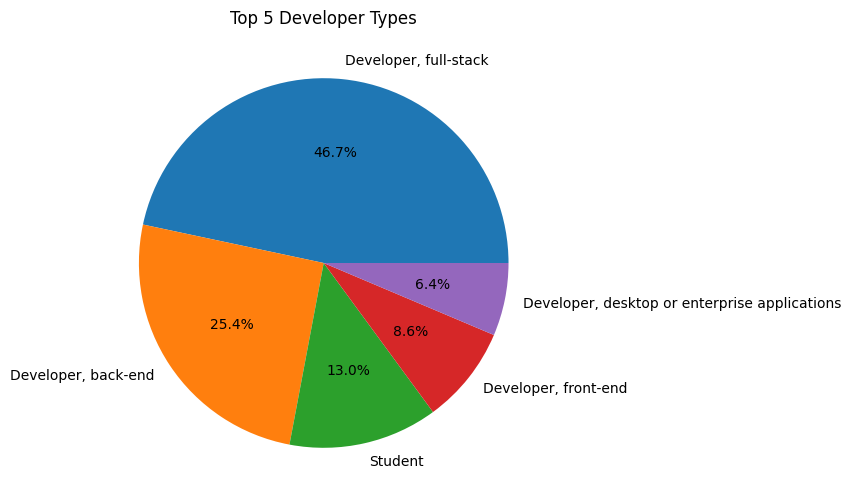

In [ ]:
# Pie Chart for Top 5 Programming Languages Respondents Have Worked With
# The LanguageHaveWorkedWith column contains the programming languages that respondents have experience with. We’ll plot a pie chart to display the composition of the top 5 languages.

top5_devtypes = df['DevType'].value_counts().head(5)
plt.figure(figsize=(10, 6))
plt.pie(top5_devtypes.values, labels=top5_devtypes.index, autopct='%1.1f%%')
plt.title('Top 5 Developer Types')
plt.show()


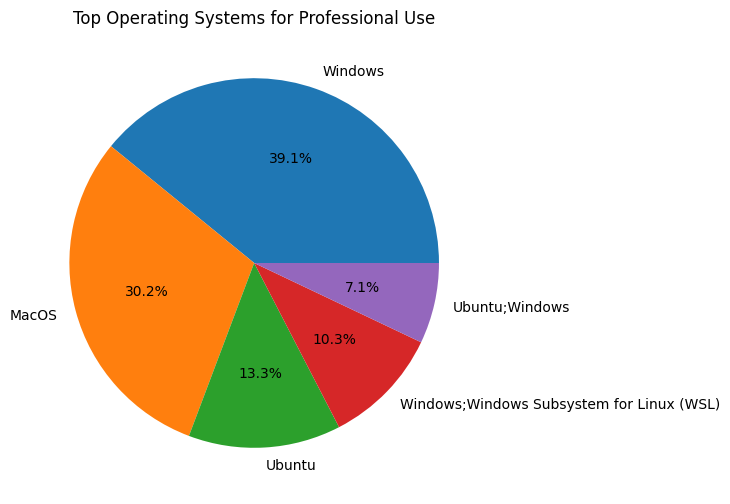

In [ ]:
# 1.3 Create a pie chart for the operating systems used by respondents for professional use
# The OpSysProfessional use column shows the operating systems developers use professionally. Let’s visualize the distribution of the top operating systems in a pie chart.

top_os = df['OpSysProfessional use'].value_counts().head(5)
plt.figure(figsize=(10, 6))
plt.pie(top_os.values, labels=top_os.index, autopct='%1.1f%%')
plt.title('Top Operating Systems for Professional Use')
plt.show()



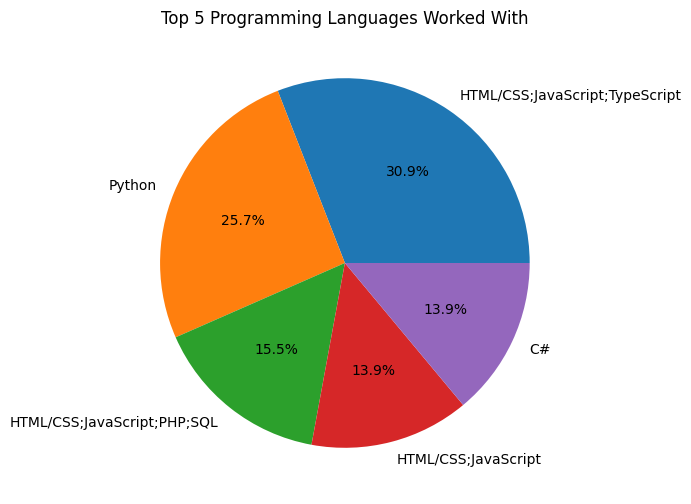

In [ ]:
# Pie Chart for Top 5 Programming Languages Respondents Have Worked With
# The LanguageHaveWorkedWith column contains the programming languages that respondents have experience with. We’ll plot a pie chart to display the composition of the top 5 languages.
top5_languages = df['LanguageHaveWorkedWith'].value_counts().head(5)
plt.figure(figsize=(10, 6))
plt.pie(top5_languages.values, labels=top5_languages.index, autopct='%1.1f%%')
plt.title('Top 5 Programming Languages Worked With')
plt.show()

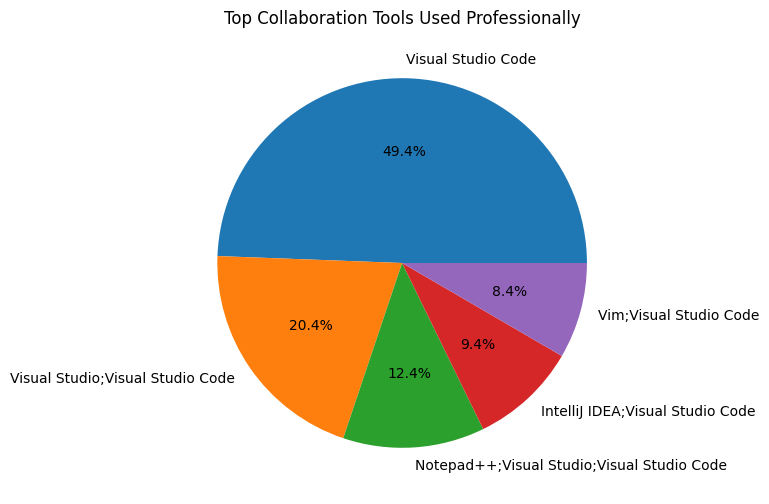

In [ ]:
# 2.2 Pie Chart for Top Collaboration Tools used in Professional Use
# Using the NEWCollabToolsHaveWorkedWith column, we’ll identify and visualize the top collaboration tools respondents use in their professional work

top_collab_tools = df['NEWCollabToolsHaveWorkedWith'].value_counts().head(5)
plt.figure(figsize=(10, 6))
plt.pie(top_collab_tools.values, labels=top_collab_tools.index, autopct='%1.1f%%')
plt.title('Top Collaboration Tools Used Professionally')
plt.show()


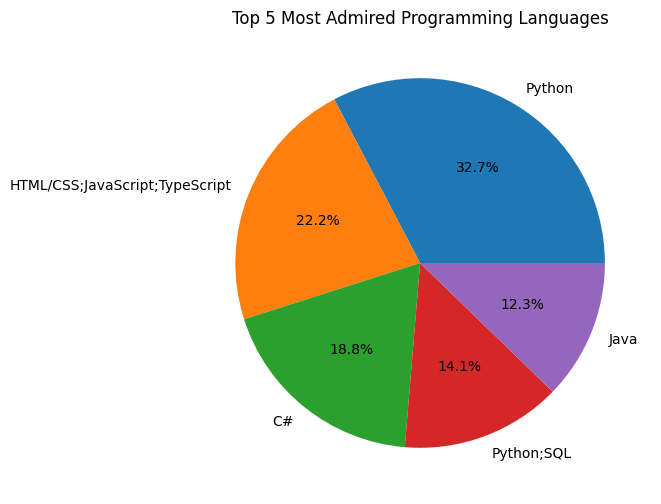

In [ ]:
# Pie Chart of Respondents Most Admired Programming Languages
# The LanguageAdmired column lists the programming languages respondents admire most. Create a pie chart to visualize the top 5 admired languages.
top5_admired = df['LanguageAdmired'].value_counts().head(5)
plt.figure(figsize=(10, 6))
plt.pie(top5_admired.values, labels=top5_admired.index, autopct='%1.1f%%')
plt.title('Top 5 Most Admired Programming Languages')
plt.show()

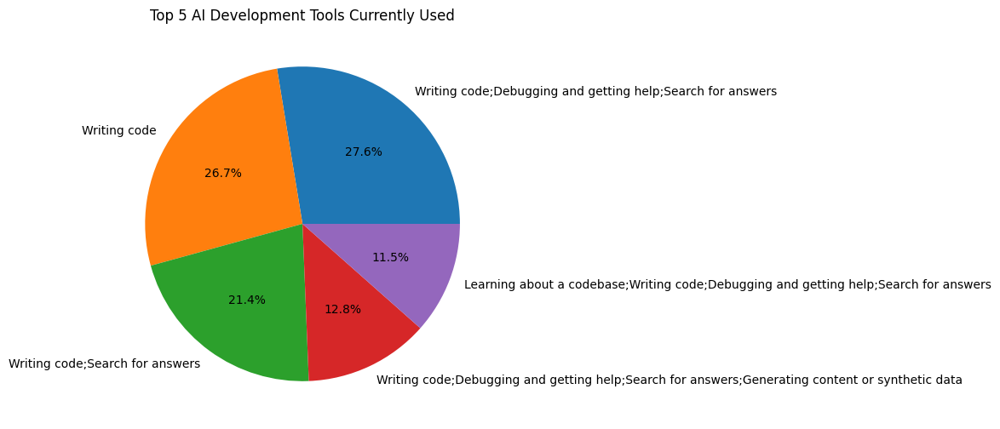

In [ ]:
# Pie Chart of Tools Used for AI Development
# Using the AIToolCurrently Using column, create a pie chart to visualize the top 5 tools developers are currently using for AI development.

top5_ai_tools = df['AIToolCurrently Using'].value_counts().head(5)
plt.figure(figsize=(10, 6))
plt.pie(top5_ai_tools.values, labels=top5_ai_tools.index, autopct='%1.1f%%')
plt.title('Top 5 AI Development Tools Currently Used')
plt.show()

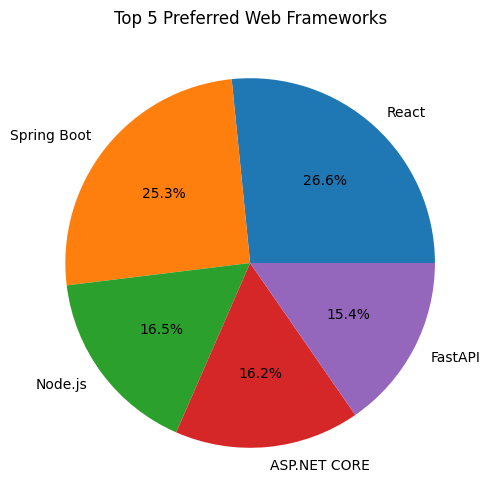

In [ ]:
#  Pie Chart for Preferred Web Frameworks
# The WebframeWantToWorkWith column includes web frameworks that respondents are interested in working with. Visualize the top 5 frameworks in a pie chart.
top5_webframes = df['WebframeWantToWorkWith'].value_counts().head(5)
plt.figure(figsize=(10, 6))
plt.pie(top5_webframes.values, labels=top5_webframes.index, autopct='%1.1f%%')
plt.title('Top 5 Preferred Web Frameworks')
plt.show()

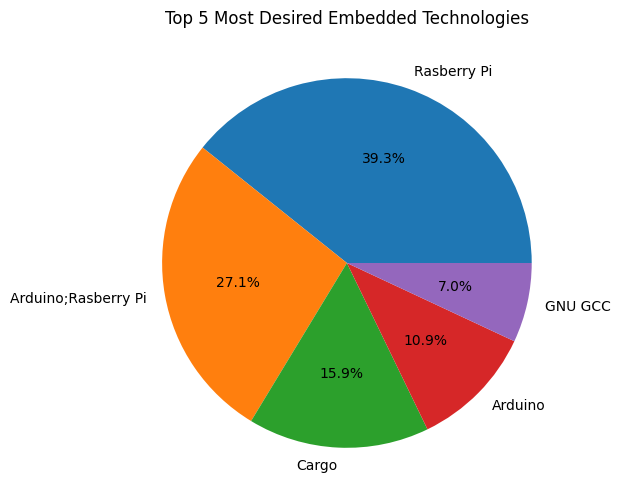

In [ ]:
# Pie Chart for Most Desired Embedded Technologies
# Using the EmbeddedWantToWorkWith column, create a pie chart to show the top 5 most desired embedded technologies that respondents wish to work with.
top5_embedded = df['EmbeddedWantToWorkWith'].value_counts().head(5)
plt.figure(figsize=(10, 6))
plt.pie(top5_embedded.values, labels=top5_embedded.index, autopct='%1.1f%%')
plt.title('Top 5 Most Desired Embedded Technologies')
plt.show()

# **part 5 completed**

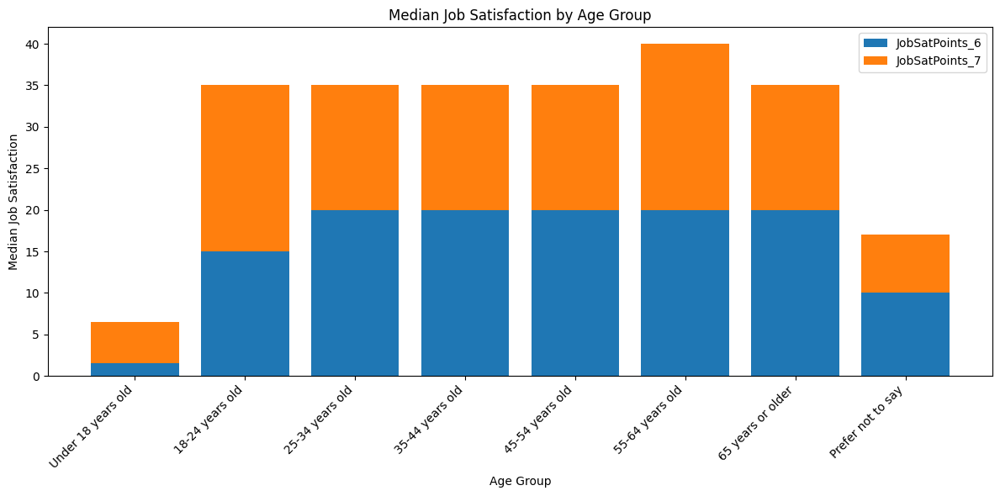

In [ ]:
# Stacked Chart of Median JobSatPoints_6 and JobSatPoints_7 for Different Age Groups
# Visualize the composition of job satisfaction scores (JobSatPoints_6 and JobSatPoints_7) across various age groups. This will help in understanding the breakdown of satisfaction levels across different demographics.

age_order = ['Under 18 years old', '18-24 years old', '25-34 years old', '35-44 years old',
             '45-54 years old', '55-64 years old', '65 years or older', 'Prefer not to say']
median_jobsat6 = df.groupby('Age')['JobSatPoints_6'].median().reindex(age_order)
median_jobsat7 = df.groupby('Age')['JobSatPoints_7'].median().reindex(age_order)

plt.figure(figsize=(12, 6))
plt.bar(age_order, median_jobsat6, label='JobSatPoints_6')
plt.bar(age_order, median_jobsat7, bottom=median_jobsat6, label='JobSatPoints_7')
plt.xlabel('Age Group')
plt.ylabel('Median Job Satisfaction')
plt.title('Median Job Satisfaction by Age Group')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()


/tmp/ipython-input-3183155652.py:16: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


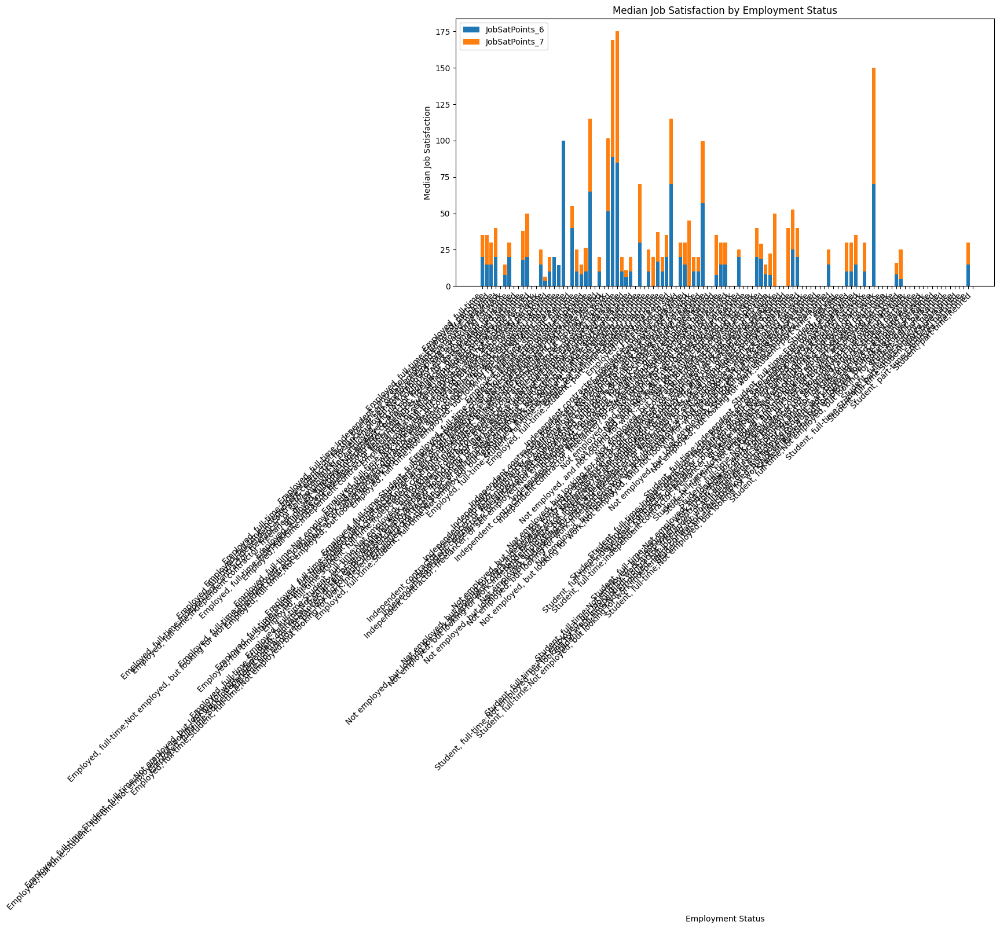

In [ ]:
# Stacked Chart of JobSatPoints_6 and JobSatPoints_7 for Employment Status
# Create a stacked chart to compare job satisfaction (JobSatPoints_6 and JobSatPoints_7) across different employment statuses. This will show how satisfaction varies by employment type.

employment_types = df['Employment'].dropna().unique()
median_jobsat6_emp = df.groupby('Employment')['JobSatPoints_6'].median()
median_jobsat7_emp = df.groupby('Employment')['JobSatPoints_7'].median()

plt.figure(figsize=(12, 6))
plt.bar(median_jobsat6_emp.index, median_jobsat6_emp.values, label='JobSatPoints_6')
plt.bar(median_jobsat7_emp.index, median_jobsat7_emp.values, bottom=median_jobsat6_emp.values, label='JobSatPoints_7')
plt.xlabel('Employment Status')
plt.ylabel('Median Job Satisfaction')
plt.title('Median Job Satisfaction by Employment Status')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

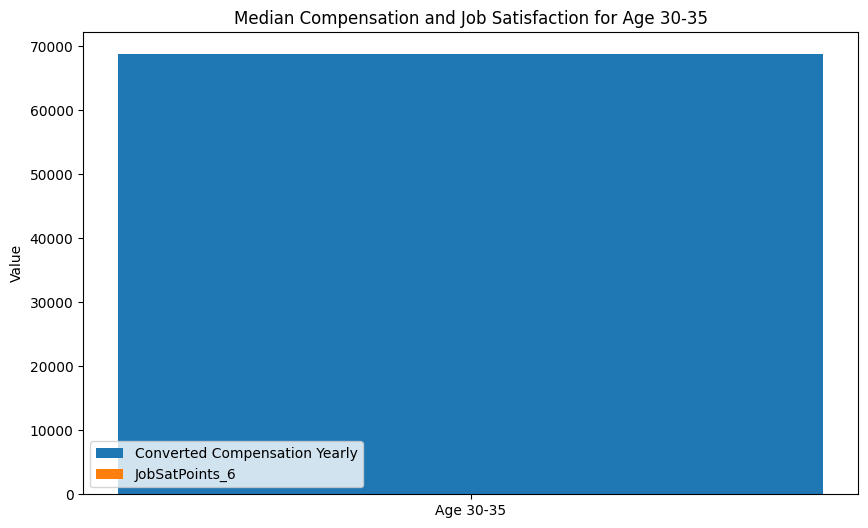

In [ ]:
# Stacked Chart for Compensation and Job Satisfaction by Age Group
# This stacked chart visualizes the composition of compensation (ConvertedCompYearly) and job satisfaction (JobSatPoints_6) specifically for respondents aged 30-35.¶

df_30_35 = df[df['Age'].isin(['25-34 years old', '35-44 years old'])].copy()
median_comp = df_30_35['ConvertedCompYearly'].median()
median_jobsat = df_30_35['JobSatPoints_6'].median()

plt.figure(figsize=(10, 6))
plt.bar(['Age 30-35'], [median_comp], label='Converted Compensation Yearly')
plt.bar(['Age 30-35'], [median_jobsat], bottom=[median_comp], label='JobSatPoints_6')
plt.ylabel('Value')
plt.title('Median Compensation and Job Satisfaction for Age 30-35')
plt.legend()
plt.show()

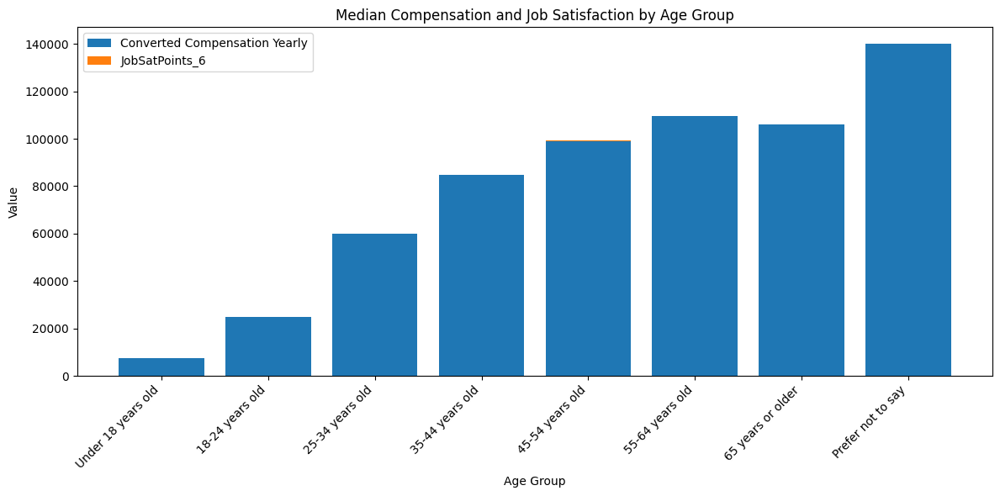

In [ ]:
# Stacked Chart of Median Compensation and Job Satisfaction Across Age Group
# Compare the median compensation and job satisfaction metrics across different age groups. This helps visualize how compensation and satisfaction levels differ by age.

median_comp_age = df.groupby('Age')['ConvertedCompYearly'].median().reindex(age_order)
median_jobsat_age = df.groupby('Age')['JobSatPoints_6'].median().reindex(age_order)

plt.figure(figsize=(12, 6))
plt.bar(age_order, median_comp_age, label='Converted Compensation Yearly')
plt.bar(age_order, median_jobsat_age, bottom=median_comp_age, label='JobSatPoints_6')
plt.xlabel('Age Group')
plt.ylabel('Value')
plt.title('Median Compensation and Job Satisfaction by Age Group')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

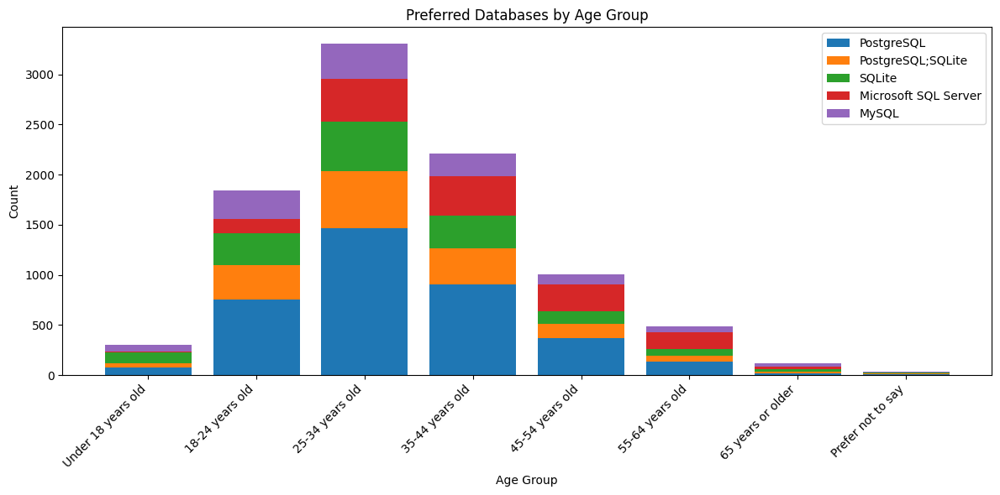

In [ ]:
# Stacked Chart of Preferred Databases by Age Group
# Visualize the top databases that respondents from different age groups wish to learn. Create a stacked chart to show the proportion of each database in each age group.


top5_databases = df['DatabaseWantToWorkWith'].value_counts().head(5).index
db_age_data = {}
for db in top5_databases:
    db_age_data[db] = [df[(df['Age'] == age) & (df['DatabaseWantToWorkWith'] == db)].shape[0] for age in age_order]

plt.figure(figsize=(12, 6))
bottom = [0] * len(age_order)
for db in top5_databases:
    plt.bar(age_order, db_age_data[db], bottom=bottom, label=db)
    bottom = [bottom[i] + db_age_data[db][i] for i in range(len(bottom))]
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.title('Preferred Databases by Age Group')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

/tmp/ipython-input-2130800871.py:15: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/tmp/ipython-input-2130800871.py:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


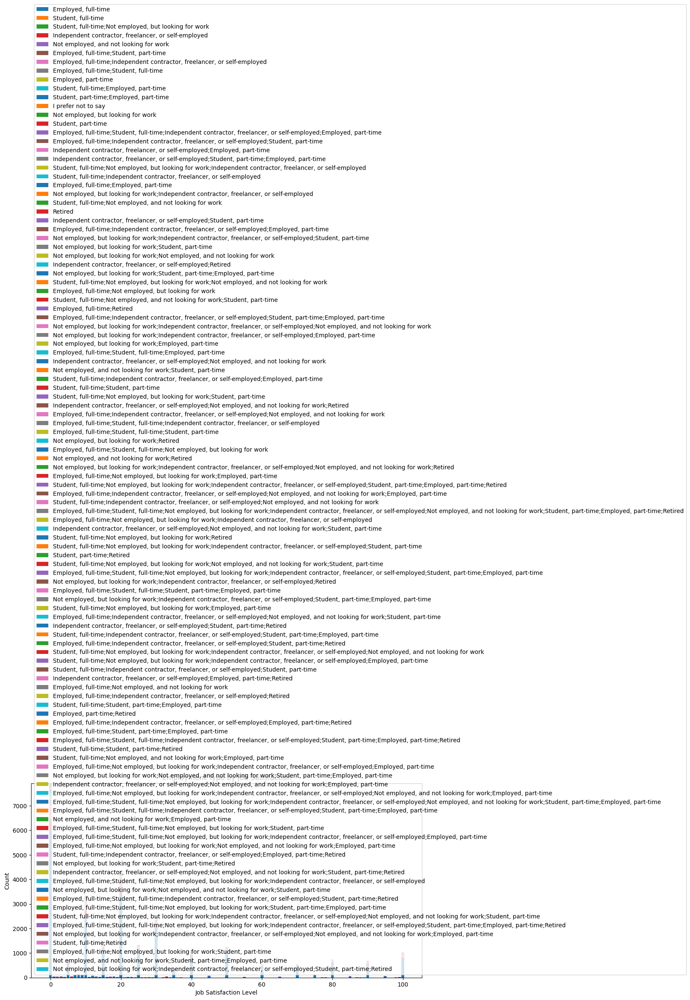

In [ ]:
# Stacked Chart of Employment Type by Job Satisfaction¶
# Analyze the distribution of employment types within each job satisfaction level using a stacked chart. This will provide insights into how employment types are distributed across various satisfaction ratings.

jobsat_levels = sorted(df['JobSatPoints_6'].dropna().unique())
emp_jobsat_data = {}
for emp in employment_types:
    emp_jobsat_data[emp] = [df[(df['JobSatPoints_6'] == level) & (df['Employment'] == emp)].shape[0] for level in jobsat_levels]

plt.figure(figsize=(12, 6))
bottom = [0] * len(jobsat_levels)
for emp in employment_types:
    plt.bar(jobsat_levels, emp_jobsat_data[emp], bottom=bottom, label=emp)
    bottom = [bottom[i] + emp_jobsat_data[emp][i] for i in range(len(bottom))]
plt.xlabel('Job Satisfaction Level')
plt.ylabel('Count')
plt.title('Employment Type by Job Satisfaction')
plt.legend()
plt.tight_layout()
plt.show()

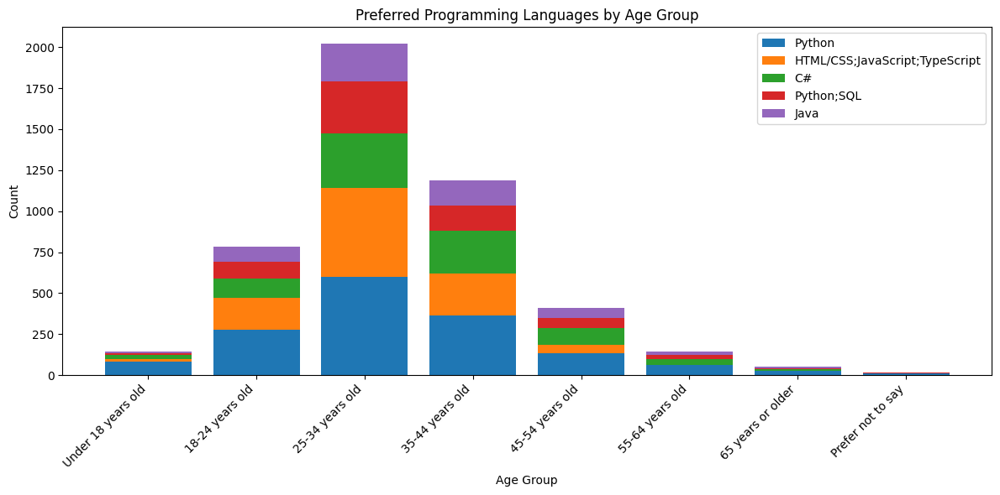

In [ ]:
# 1. Stacked Chart for Preferred Programming Languages by Age Group
# Analyze how programming language preferences (LanguageAdmired) vary across age groups.

top5_languages = df['LanguageAdmired'].value_counts().head(5).index
lang_age_data = {}
for lang in top5_languages:
    lang_age_data[lang] = [df[(df['Age'] == age) & (df['LanguageAdmired'] == lang)].shape[0] for age in age_order]

plt.figure(figsize=(12, 6))
bottom = [0] * len(age_order)
for lang in top5_languages:
    plt.bar(age_order, lang_age_data[lang], bottom=bottom, label=lang)
    bottom = [bottom[i] + lang_age_data[lang][i] for i in range(len(bottom))]
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.title('Preferred Programming Languages by Age Group')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

/tmp/ipython-input-3411953659.py:17: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


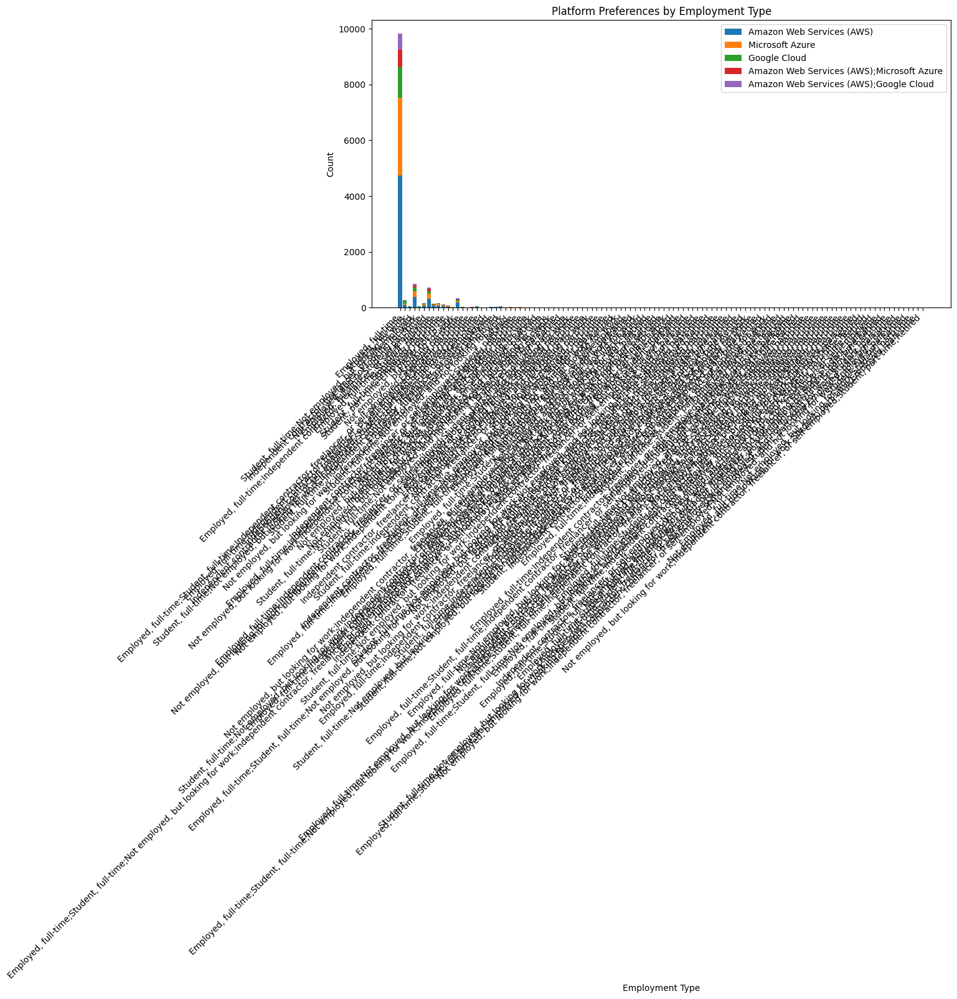

In [ ]:

# Stacked Chart for Technology Adoption by Employment Type
# Explore how admired platforms (PlatformAdmired) differ across employment types (e.g., full-time, freelance)

top5_platforms = df['PlatformAdmired'].value_counts().head(5).index
platform_emp_data = {}
for platform in top5_platforms:
    platform_emp_data[platform] = [df[(df['Employment'] == emp) & (df['PlatformAdmired'] == platform)].shape[0] for emp in employment_types]

plt.figure(figsize=(12, 6))
bottom = [0] * len(employment_types)
for platform in top5_platforms:
    plt.bar(employment_types, platform_emp_data[platform], bottom=bottom, label=platform)
    bottom = [bottom[i] + platform_emp_data[platform][i] for i in range(len(bottom))]
plt.xlabel('Employment Type')
plt.ylabel('Count')
plt.title('Platform Preferences by Employment Type')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

# **Part 6 completed**

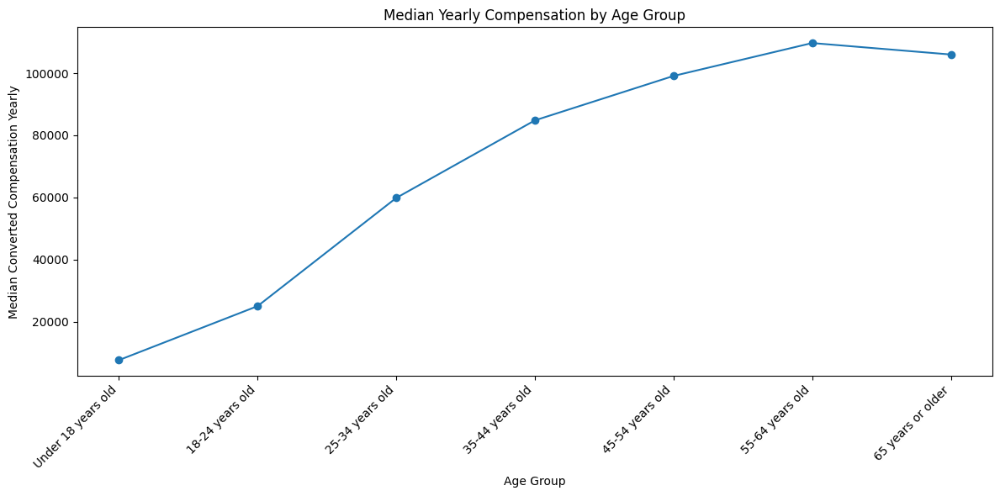

In [ ]:
# Line Chart of Median ConvertedCompYearly by Age Group¶

# Track how the median yearly compensation (ConvertedCompYearly) changes across different age groups.
# Use a line chart to visualize these trends.

age_order = ['Under 18 years old', '18-24 years old', '25-34 years old', '35-44 years old',
             '45-54 years old', '55-64 years old', '65 years or older']
median_comp_age = df.groupby('Age')['ConvertedCompYearly'].median().reindex(age_order)

plt.figure(figsize=(12, 6))
plt.plot(age_order, median_comp_age.values, marker='o')
plt.xlabel('Age Group')
plt.ylabel('Median Converted Compensation Yearly')
plt.title('Median Yearly Compensation by Age Group')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

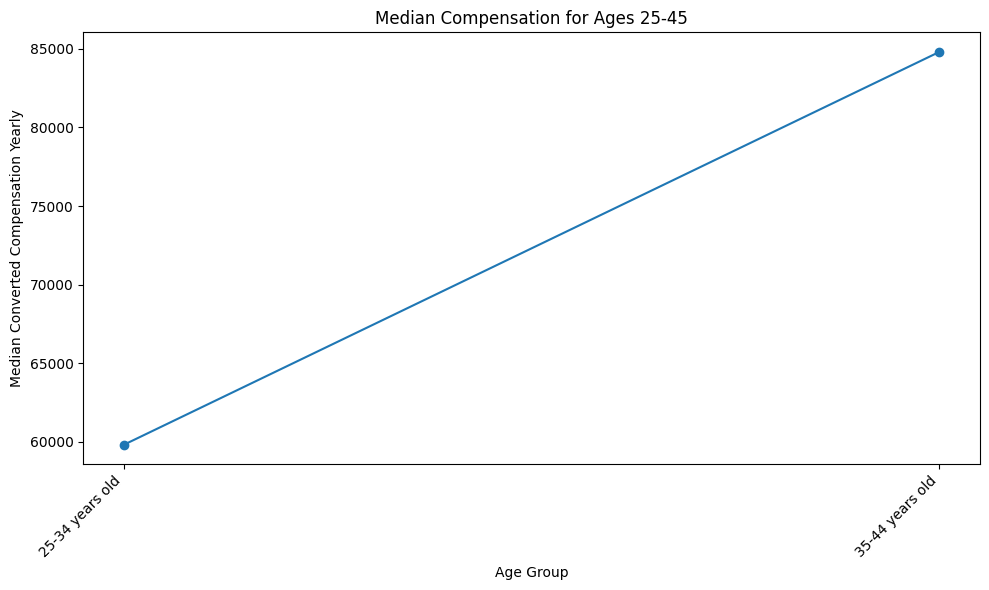

In [ ]:
# Line Chart of Median ConvertedCompYearly for Ages 25 to 45
# For a closer look, plot a line chart focusing on the median compensation for respondents between ages 25 and 45.


age_25_45 = ['25-34 years old', '35-44 years old']
median_comp_25_45 = df.groupby('Age')['ConvertedCompYearly'].median().reindex(age_25_45)

plt.figure(figsize=(10, 6))
plt.plot(age_25_45, median_comp_25_45.values, marker='o')
plt.xlabel('Age Group')
plt.ylabel('Median Converted Compensation Yearly')
plt.title('Median Compensation for Ages 25-45')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

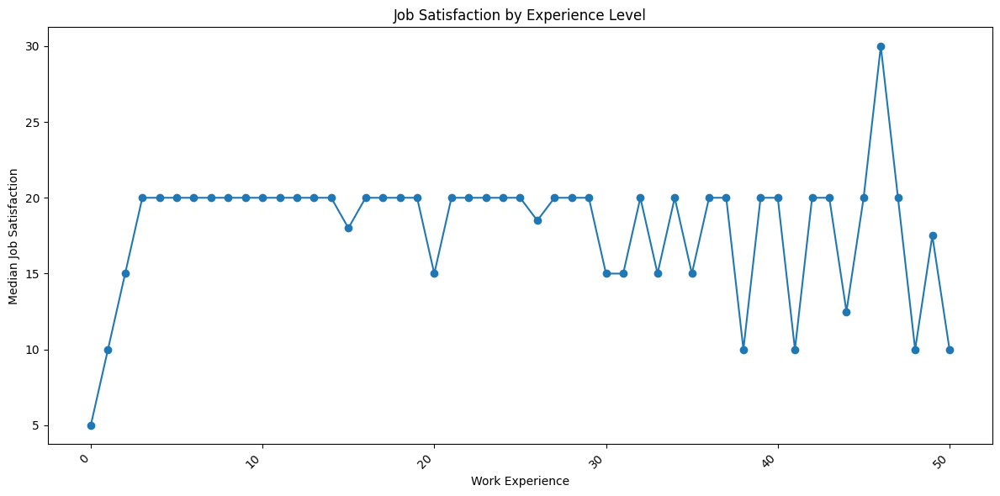

In [ ]:
# Line Chart of Job Satisfaction (JobSatPoints_6) by Experience Level
# Use a column that approximates experience level to analyze how job satisfaction changes with experience.
# If needed, substitute an available experience-related column for Experience.

workexp_levels = sorted(df['WorkExp'].dropna().unique())
median_jobsat_exp = df.groupby('WorkExp')['JobSatPoints_6'].median().reindex(workexp_levels)

plt.figure(figsize=(12, 6))
plt.plot(workexp_levels, median_jobsat_exp.values, marker='o')
plt.xlabel('Work Experience')
plt.ylabel('Median Job Satisfaction')
plt.title('Job Satisfaction by Experience Level')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


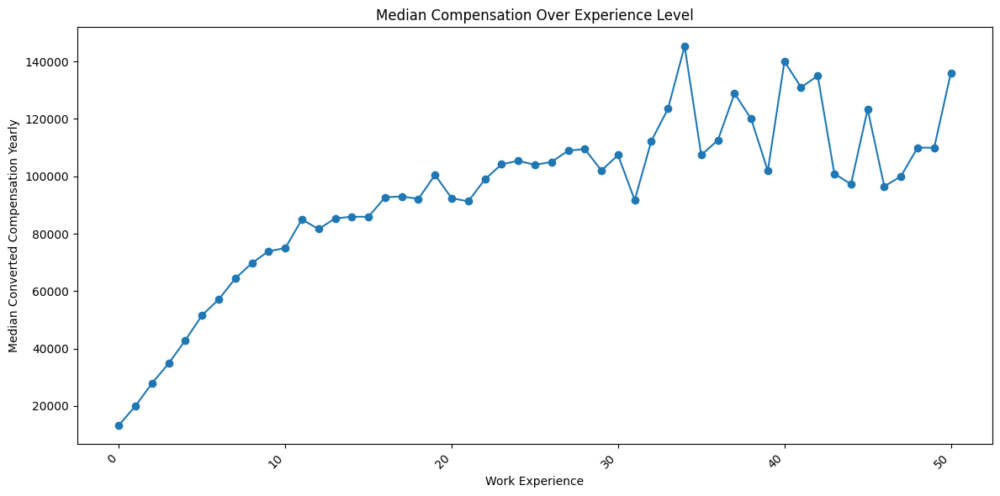

In [ ]:
# 1.Line Chart of Median ConvertedCompYearly Over Experience Level

# - This line chart will track how median compensation (`ConvertedCompYearly`) changes with increasing experience.
# - Use a column such as `WorkExp` or another relevant experience-related column.

median_comp_exp = df.groupby('WorkExp')['ConvertedCompYearly'].median().reindex(workexp_levels)

plt.figure(figsize=(12, 6))
plt.plot(workexp_levels, median_comp_exp.values, marker='o')
plt.xlabel('Work Experience')
plt.ylabel('Median Converted Compensation Yearly')
plt.title('Median Compensation Over Experience Level')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


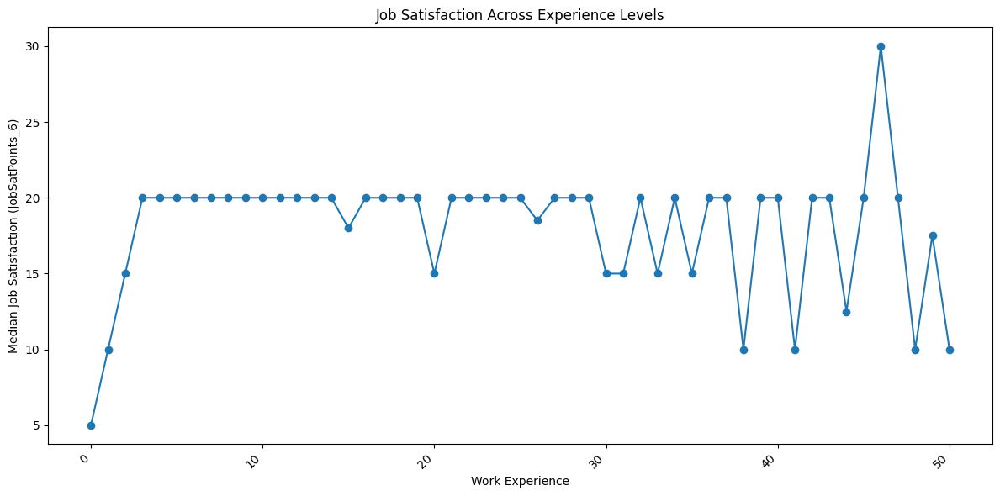

In [ ]:
# 2.Line Chart of Job Satisfaction (`JobSatPoints_6`) Across Experience Levels

# - Create a line chart to explore trends in job satisfaction (`JobSatPoints_6`) based on experience level.
# - This chart will provide insight into how satisfaction correlates with experience over time

plt.figure(figsize=(12, 6))
plt.plot(workexp_levels, median_jobsat_exp.values, marker='o')
plt.xlabel('Work Experience')
plt.ylabel('Median Job Satisfaction (JobSatPoints_6)')
plt.title('Job Satisfaction Across Experience Levels')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# **Part 7 complete**

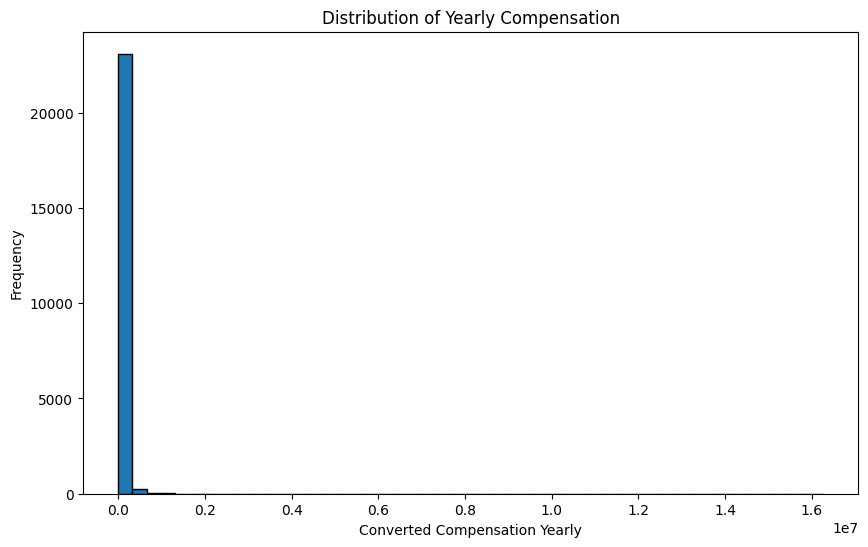

In [ ]:
#Histogram of ConvertedCompYearly
#Visualize the distribution of yearly compensation (ConvertedCompYearly) using a histogram.

plt.figure(figsize=(10, 6))
plt.hist(df['ConvertedCompYearly'].dropna(), bins=50, edgecolor='black')
plt.xlabel('Converted Compensation Yearly')
plt.ylabel('Frequency')
plt.title('Distribution of Yearly Compensation')
plt.show()

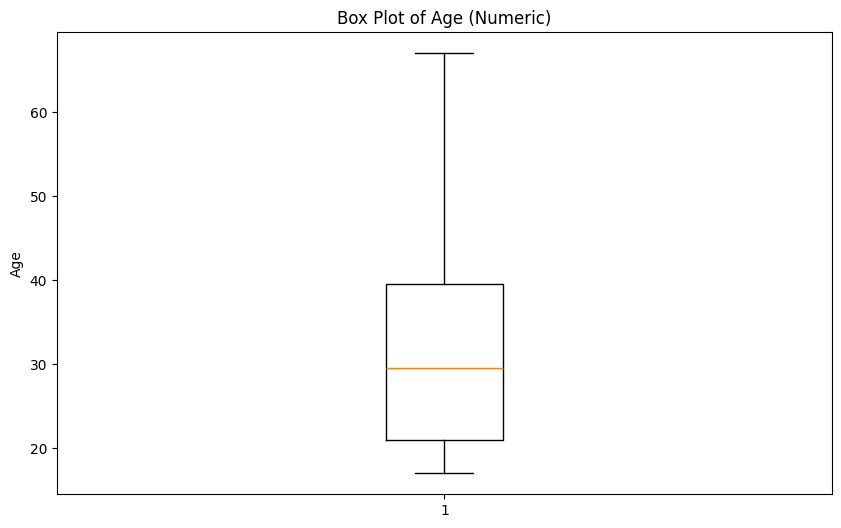

In [ ]:
#  Box Plot of Age¶
# Since Age is categorical in the dataset, convert it to numerical values for a box plot.
# age_mapping = {
    'Under 18 years old': 17,
    '18-24 years old': 21,
    '25-34 years old': 29.5,
    '35-44 years old': 39.5,
    '45-54 years old': 49.5,
    '55-64 years old': 59.5,
    '65 years or older': 67,
    'Prefer not to say': None
}
df['Age_numeric'] = df['Age'].map(age_mapping)

plt.figure(figsize=(10, 6))
plt.boxplot(df['Age_numeric'].dropna())
plt.ylabel('Age')
plt.title('Box Plot of Age (Numeric)')
plt.show()


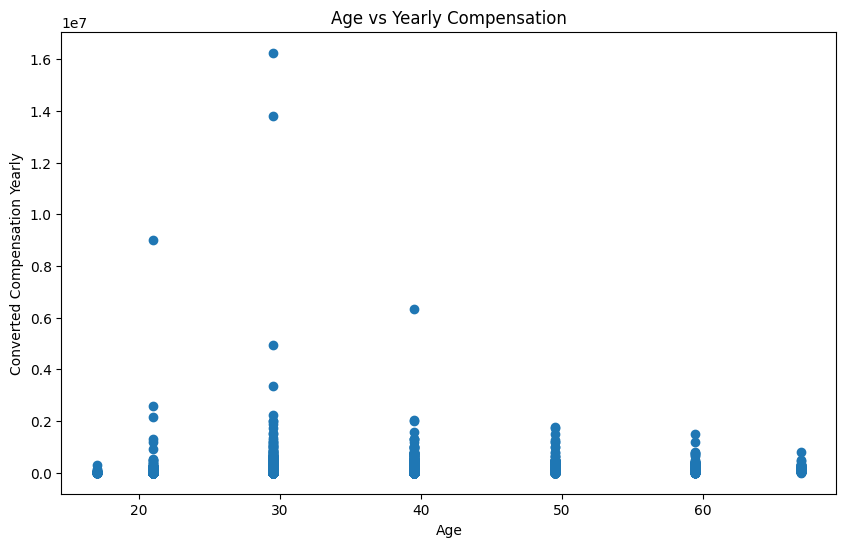

In [ ]:
# 1. Scatter Plot of Age_numeric and ConvertedCompYearly
# Explore the relationship between age and compensation.
df_clean = df[['Age_numeric', 'ConvertedCompYearly']].dropna()
plt.figure(figsize=(10, 6))
plt.scatter(df_clean['Age_numeric'], df_clean['ConvertedCompYearly'])
plt.xlabel('Age')
plt.ylabel('Converted Compensation Yearly')
plt.title('Age vs Yearly Compensation')
plt.show()

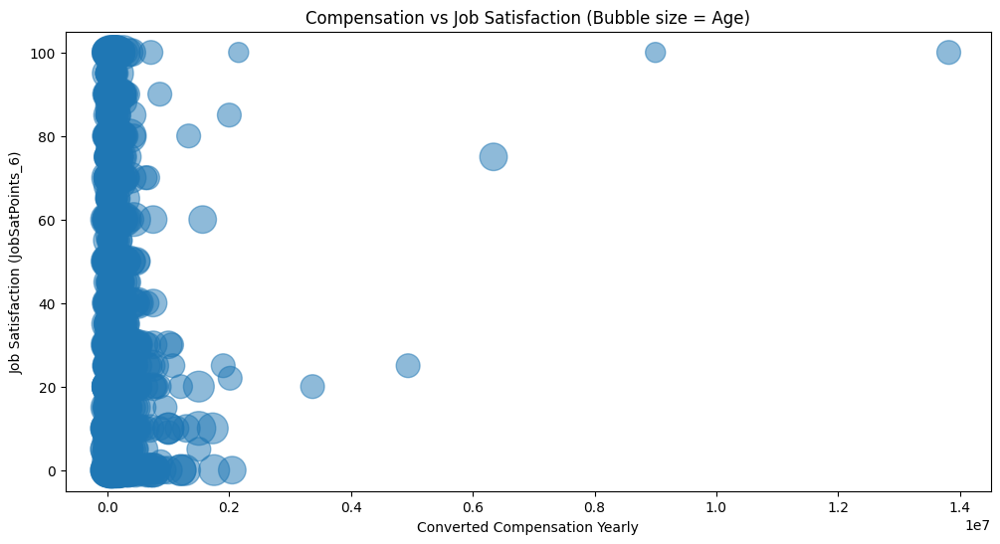

In [ ]:
# 2. Bubble Plot of ConvertedCompYearly and JobSatPoints_6 with Age_numeric as Bubble Size
# Explore how compensation and job satisfaction are related, with age as the bubble size.

df_clean = df[['ConvertedCompYearly', 'JobSatPoints_6', 'Age_numeric']].dropna()
plt.figure(figsize=(12, 6))
plt.scatter(df_clean['ConvertedCompYearly'], df_clean['JobSatPoints_6'], s=df_clean['Age_numeric']*10, alpha=0.5)
plt.xlabel('Converted Compensation Yearly')
plt.ylabel('Job Satisfaction (JobSatPoints_6)')
plt.title('Compensation vs Job Satisfaction (Bubble size = Age)')
plt.show()

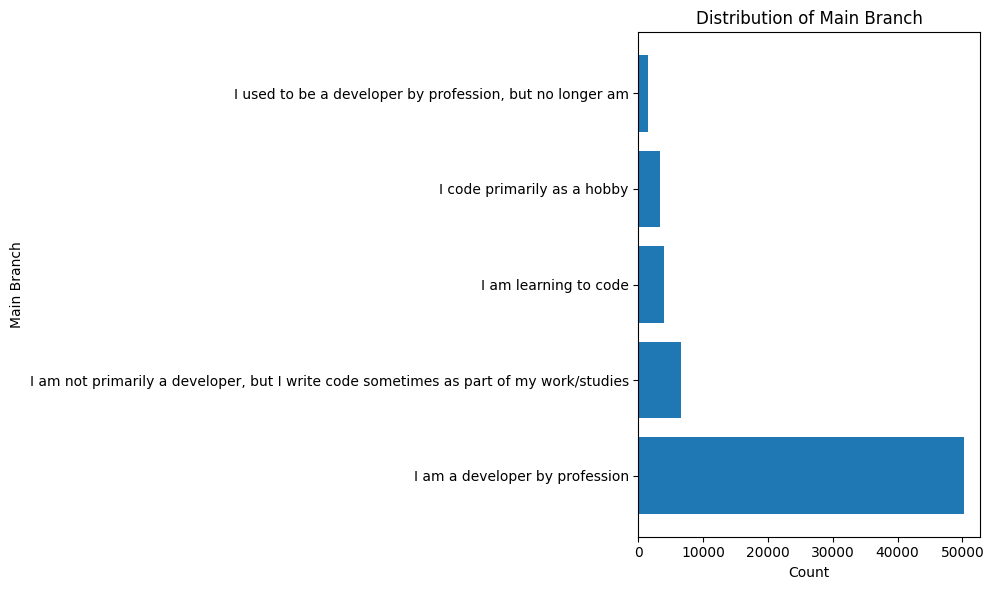

In [ ]:
# 1. Horizontal Bar Chart of MainBranch Distribution
# Visualize the distribution of respondents’ primary roles to understand their professional focus.

mainbranch_counts = df['MainBranch'].value_counts()
plt.figure(figsize=(10, 6))
plt.barh(mainbranch_counts.index, mainbranch_counts.values)
plt.xlabel('Count')
plt.ylabel('Main Branch')
plt.title('Distribution of Main Branch')
plt.tight_layout()
plt.show()

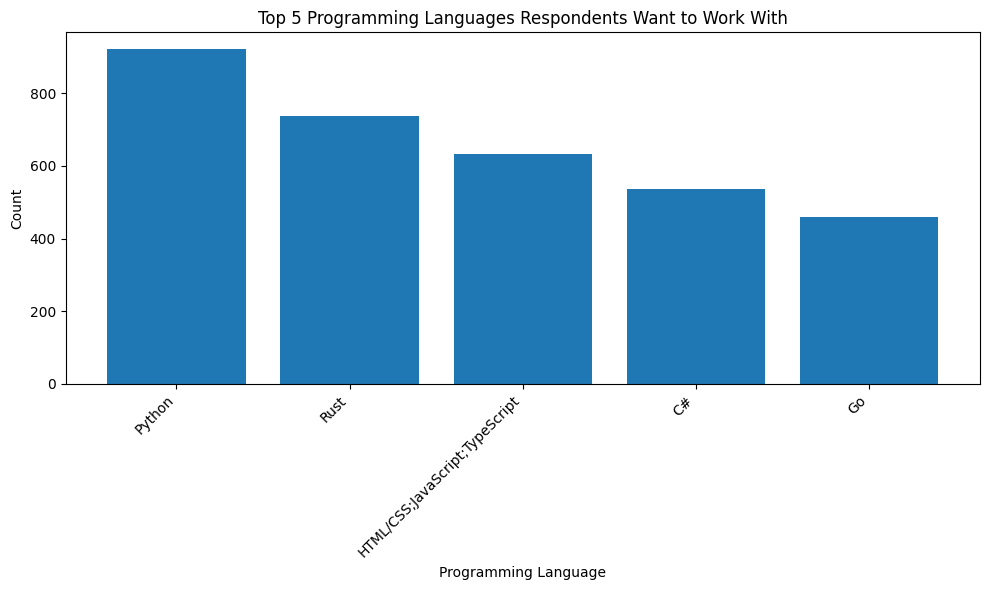

In [ ]:
# 2. Vertical Bar Chart of Top 5 Programming Languages Respondents Want to Work With
# Identify the most desired programming languages based on LanguageWantToWorkWith.
top5_lang_want = df['LanguageWantToWorkWith'].value_counts().head(5)
plt.figure(figsize=(10, 6))
plt.bar(top5_lang_want.index, top5_lang_want.values)
plt.xlabel('Programming Language')
plt.ylabel('Count')
plt.title('Top 5 Programming Languages Respondents Want to Work With')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


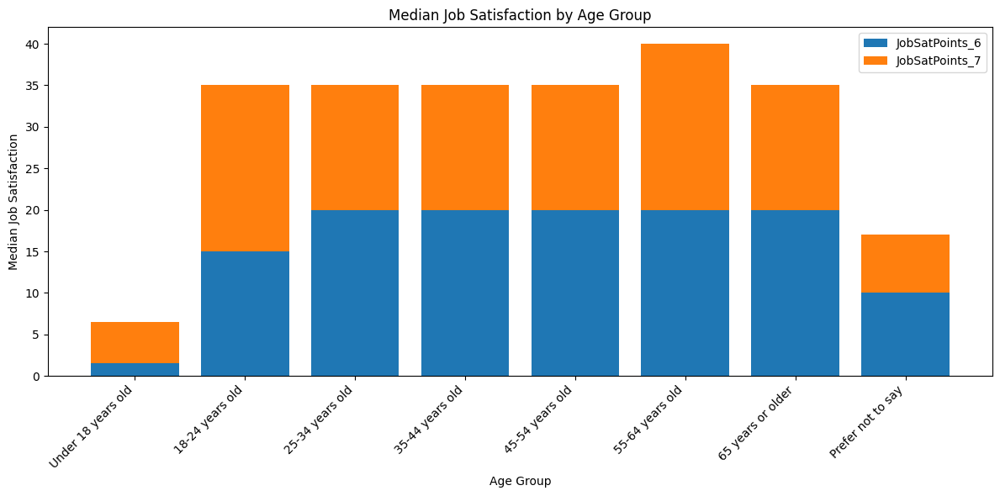

In [ ]:
# 3. Stacked Bar Chart of Median JobSatPoints_6 and JobSatPoints_7 by Age Group
# Compare job satisfaction metrics across different age groups with a stacked bar chart.
age_order = ['Under 18 years old', '18-24 years old', '25-34 years old', '35-44 years old',
             '45-54 years old', '55-64 years old', '65 years or older', 'Prefer not to say']
median_jobsat6 = df.groupby('Age')['JobSatPoints_6'].median().reindex(age_order)
median_jobsat7 = df.groupby('Age')['JobSatPoints_7'].median().reindex(age_order)

plt.figure(figsize=(12, 6))
plt.bar(age_order, median_jobsat6, label='JobSatPoints_6')
plt.bar(age_order, median_jobsat7, bottom=median_jobsat6, label='JobSatPoints_7')
plt.xlabel('Age Group')
plt.ylabel('Median Job Satisfaction')
plt.title('Median Job Satisfaction by Age Group')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

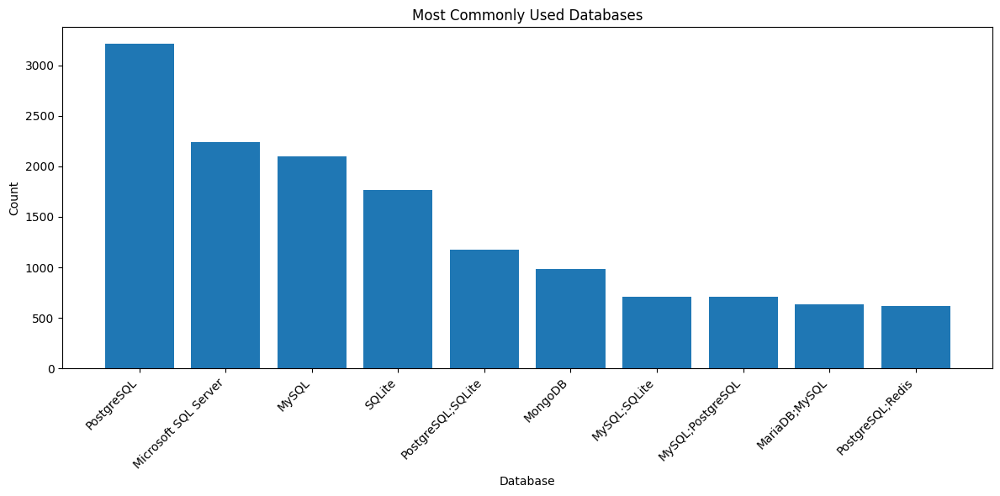

In [ ]:
# 4. Bar Chart of Database Popularity (DatabaseHaveWorkedWith)
# Identify the most commonly used databases among respondents by visualizing DatabaseHaveWorkedWith.

top_databases = df['DatabaseHaveWorkedWith'].value_counts().head(10)
plt.figure(figsize=(12, 6))
plt.bar(top_databases.index, top_databases.values)
plt.xlabel('Database')
plt.ylabel('Count')
plt.title('Most Commonly Used Databases')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

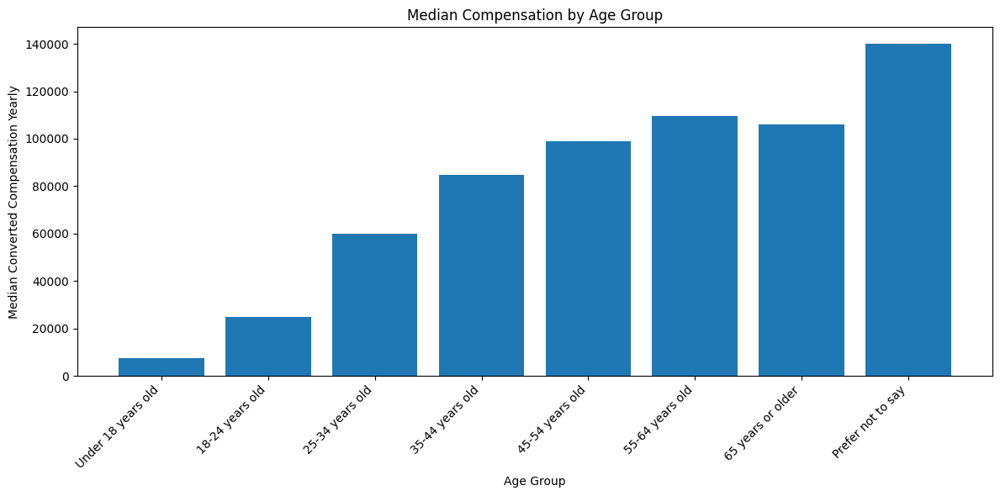

In [ ]:
# Task 4: Visualizing Comparison of Data with Bar Charts¶
# 1. Grouped Bar Chart of Median ConvertedCompYearly for Different Age Groups
# Compare median compensation across multiple age groups with a grouped bar chart.
# 9. Grouped Bar Chart of Median ConvertedCompYearly for Different Age Groups

median_comp_age = df.groupby('Age')['ConvertedCompYearly'].median().reindex(age_order)
plt.figure(figsize=(12, 6))
plt.bar(age_order, median_comp_age.values)
plt.xlabel('Age Group')
plt.ylabel('Median Converted Compensation Yearly')
plt.title('Median Compensation by Age Group')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


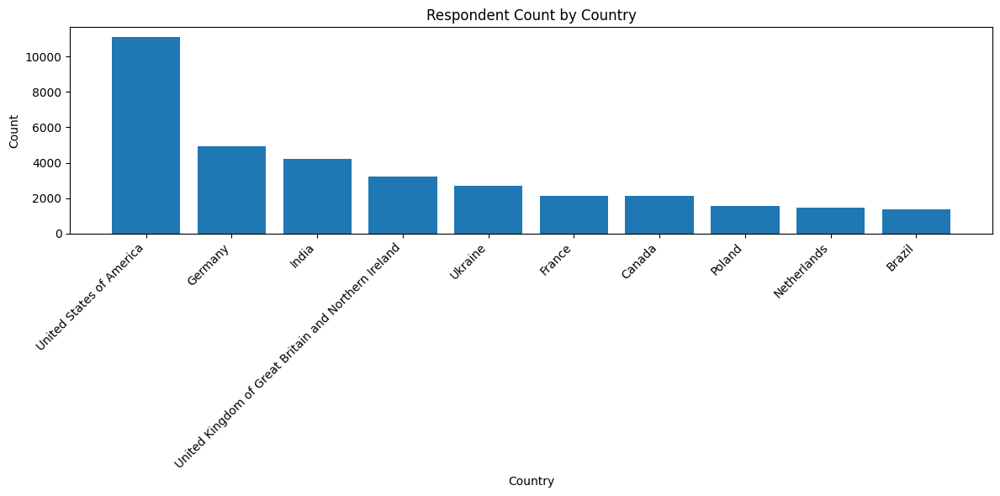

In [ ]:
# 2. Bar Chart of Respondent Count by Country
# Show the distribution of respondents by country to see which regions are most represented.

top_countries = df['Country'].value_counts().head(10)
plt.figure(figsize=(12, 6))
plt.bar(top_countries.index, top_countries.values)
plt.xlabel('Country')
plt.ylabel('Count')
plt.title('Respondent Count by Country')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()